# PCA

## Introduction

$$
\begin{align}
\text{Training Set} & = \{x^{(1)},x^{(2)},.......,x^{(m)} \} \\
\\
x^{(i)} & \in {\rm I\!R}^{n} \\
\end{align}
$$


<button type="button" class="btn btn-danger">GOAL:   Reduce Data into lower (k) dimensional dataset  [k < n]  </button>
<br>
<br>
 Find Principal (Main) Axes along which the data actualy "vary"
 <br><br>
<button type="button" class="btn btn-info"> WHY? </button>  

>> The data actually lies along some diagonal axis (the u1 direction) capturing the intrinsic piloting "karma" of a person, with only a small amount of noise lying off this axis.  How can we automatically compute this u1?
direction?

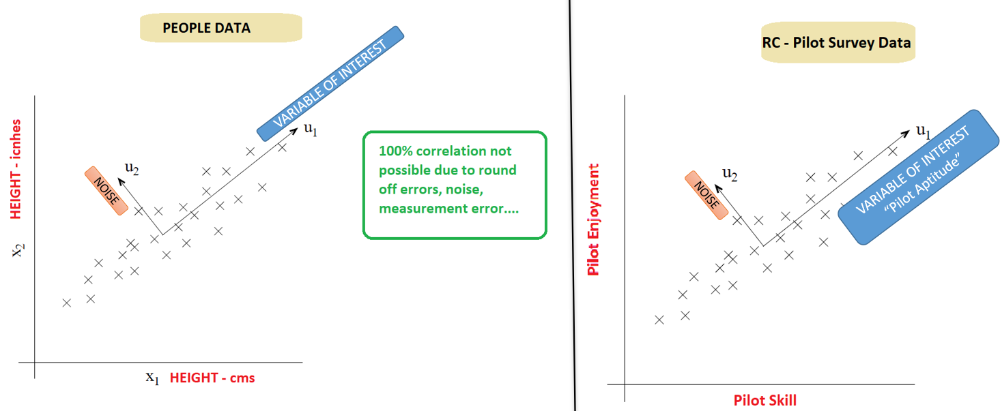

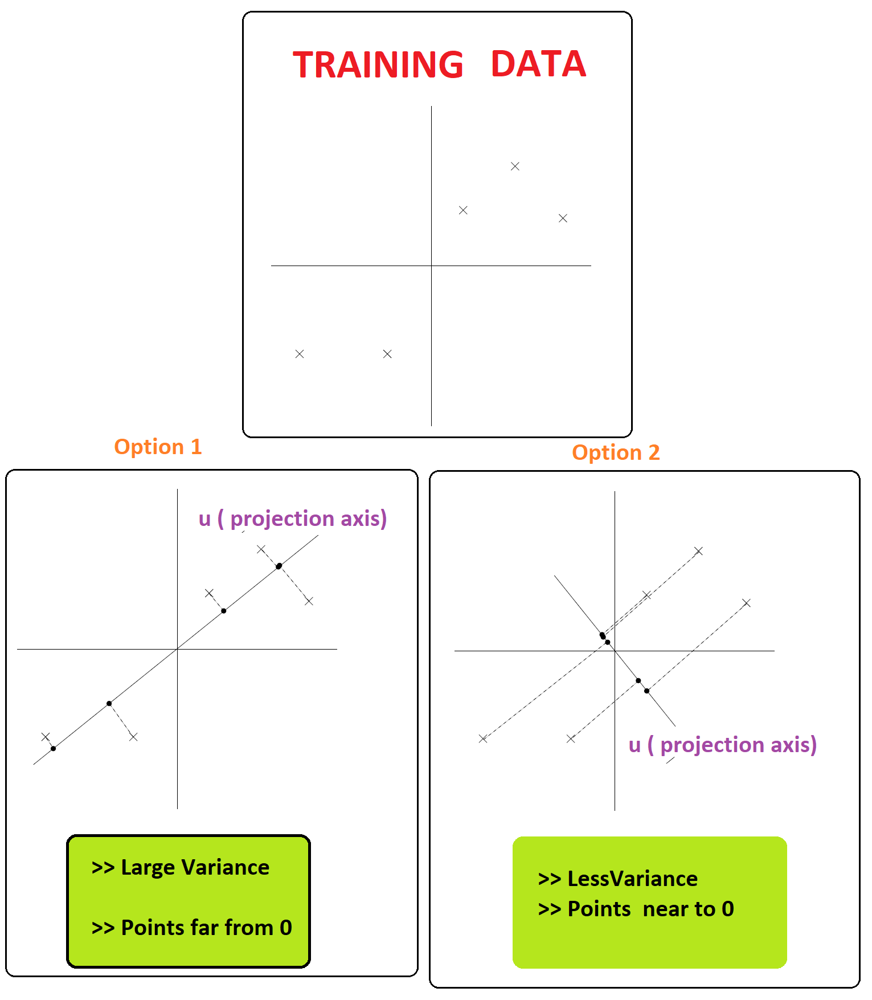

## Preprocessing Data

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:lightgreen;">
   $$ PREPROCESSING- DATA :$$ <br>
$\displaystyle{
1. \quad Set \quad \mu =\frac{1}{m} \sum_{i=1}^{m} x^{(i)}  \\
2. \quad \text{Replace each} \quad  x^{(i)} \quad \text{with } \quad  (x^{(i)}-\mu)  \\
3. \quad Let \quad \sigma_{j}^{2} =\frac{1}{m} \sum_{i}\left(x_{j}^{(i)}\right)^{2}  \\
4. \quad \text{Replace each }\quad  x_{j}^{(i)} \quad  with \quad  \frac{x_{j}^{(i)}}{\sigma_{j}} 
}$       
</p>
    
<button type="button" class="btn btn-danger">STEPS (1-2) :  Zero Out Mean  </button>   
    <br>
<button type="button" class="btn btn-danger">STEPS (3-4) :  Normalize to Unit Variance  (Usually Done when features are on Very Different Scales)  </button>  
    <br>
<button type="button" class="btn btn-info">STEPS (3-4) :  Not needed when data are on same scael (eg: Pixel Intensity Values)  </button>  
<br>
<button type="button" class="btn btn-info"> Steps (1-2) may be omitted for data
known to have zero mean (for instance, time series corresponding to speech
or other acoustic signals)</button>  
    
   

## Algorithm

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:lightblue;">
<b>$$ALGORITHM$$</b> 

</p>

<button type="button" class="btn btn-danger">Assumption: Underlying Sub-space is LINEAR!!  </button>

$
    \text{If} \left\lVert u\right\rVert = 1, \\ \\ \text{then the vector} \quad  \vec{x}^{(i)} \quad\text{projected on to } \vec{u} \quad \text{has length} \quad x^{(i)^{T}}. u
$

$$
\max _{\text {s.t. }||u||=1} \quad \frac{1}{m} \sum_{i=1}^{m}\left(x^{(i)^{T}} u\right)^{2}
$$

$$\text{Note: Sum of Squared Distanced from origin to the point of projection should be maximized} $$

$$
\begin{aligned}
&=\frac{1}{m} \sum_{i=1}^{m}( u^{T} x^{(i)}) (x^{(i)^{T}} u) \\
&=u^{T}\left(\frac{1}{m} \sum_{i=1}^{m} x^{(i)} x^{(i)^{T}}\right) u
\end{aligned}
$$

$$
\begin{aligned}
&=u^{T} .\text{[MATRIX]}. u \\
&=u^{T}. \Sigma .u \\
\end{aligned}
$$

$$
\implies u = \text{Principal Eigen Vector of this matrix}
$$
$$
\text{Let} \quad 
\Sigma=\frac{1}{m} \sum_{i=1}^{m} x^{(i)} x^{(i)^{T}}
$$

<div class="alert alert-block alert-danger">
<b>Note on Eigen Vectors </b> 

$$
If \quad A\vec{u} = \lambda\vec{u} \\
 \lambda = Eigen value, \vec{u} = Eigen Vector \\
 \text{Principal Eigen Vector} = \text{Eigen Vector with Largest Eigen Value}
$$
</div>

<div class="alert alert-block alert-info">
<b>Note on Solving Constarined  Optimization Problems  </b> 
    <br>    <br>
Objective Function :
 $$
\max _{\text {s.t. }||u||=1} \quad \frac{1}{m} \sum_{i=1}^{m}\left(x^{(i)^{T}} u\right)^{2} \\
 = u^{T} \Sigma u
$$   
    <br>
Constraint:
    $$
    \left\lVert u\right\rVert = u^{T}u = 1
    $$
     <br> <br>
Solution using Lagrangian Method:
    <br> <br>
$$
\text{Lagrangian Function} = L(u, \lambda) = u^{T} \Sigma u  - \lambda(u^{T}u-1) \\
\nabla_{u}L = \Sigma u - \lambda u \stackrel{!}{=} 0 \\
\Sigma u = \lambda u \\
\implies \vec{u} = \text{ Eigen Vector of} \quad \Sigma \quad \text{with Eigen value of} \lambda
$$
</div>

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:lightgreen;">
   $$ AlGORITHM --STEPS$$ <br>
$
1. \quad \text{Perfrom Preprocessing on} \text{ Training Set = }   \{x^{(1)},x^{(2)},.......,x^{(m)} \}  \quad \quad x^{(i)}  \in {\rm I\!R}^{n}  \\
2. \quad \text{Find the top-k Eigen vectors $\{u_{1},u_{2},....u_{k} \}$ of the covariance matrix}  \quad  \Sigma=\frac{1}{m} \sum_{i=1}^{m} x^{(i)} x^{(i)^{T}}  \\
3. \quad Let \quad \{u_{1},u_{2},....u_{k} \} \quad \text{be the new basis vectors for the sub-space}    \\
4. \quad \text{The  } u^{(i)}  \text{s    now form a new, orthogonal basis for the data. Then, to represent}  x^{(i)} \text{ in this basis, find} x_{new}^{(i)} \\
5. x_{new}^{(i)}=\left[\begin{array}{c}
u_{1}^{T} x^{(i)} \\
u_{2}^{T} x^{(i)} \\
\vdots \\
u_{k}^{T} x^{(i)}
\end{array}\right] \in \mathbb{R}^{k}
$      
</p>
    
<button type="button" class="btn btn-danger">Note: Symmetric Matrices are never deficient of unique eigen vectors </button>   
    
   

<div class="alert alert-block alert-danger">
<b>Note on Choosing Eigen Vectors:: </b> 
</div>

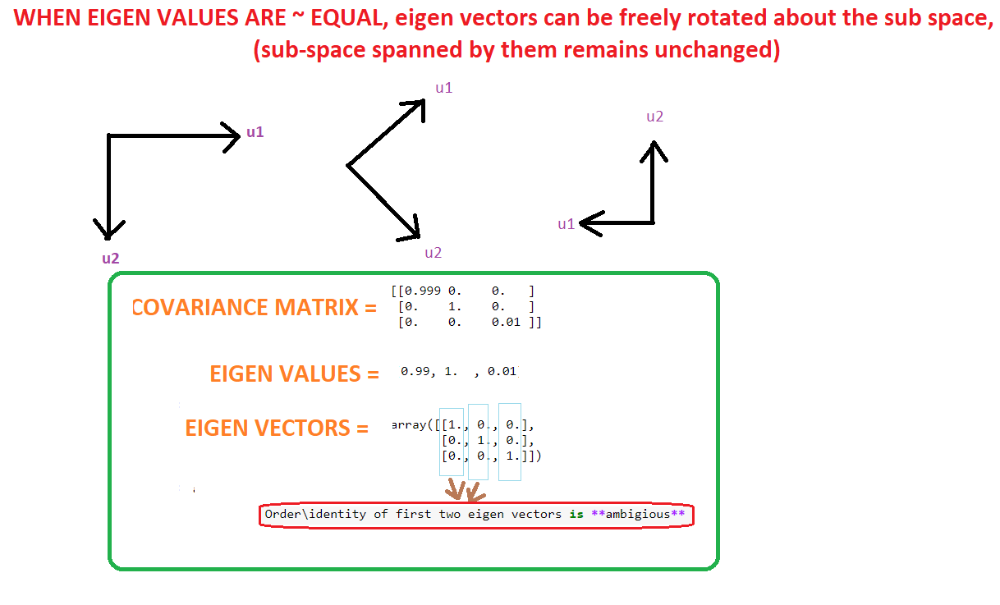

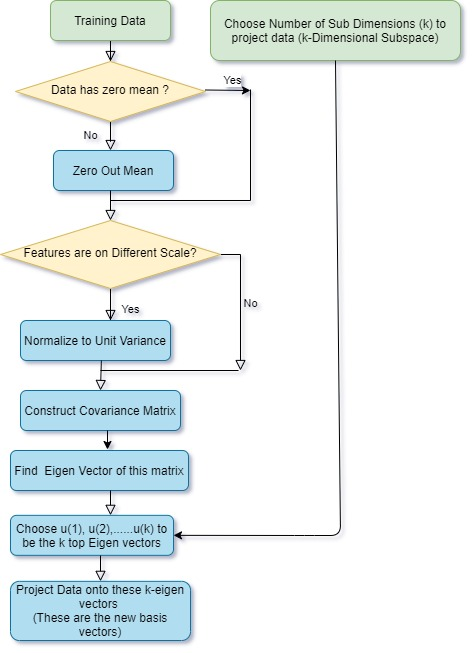

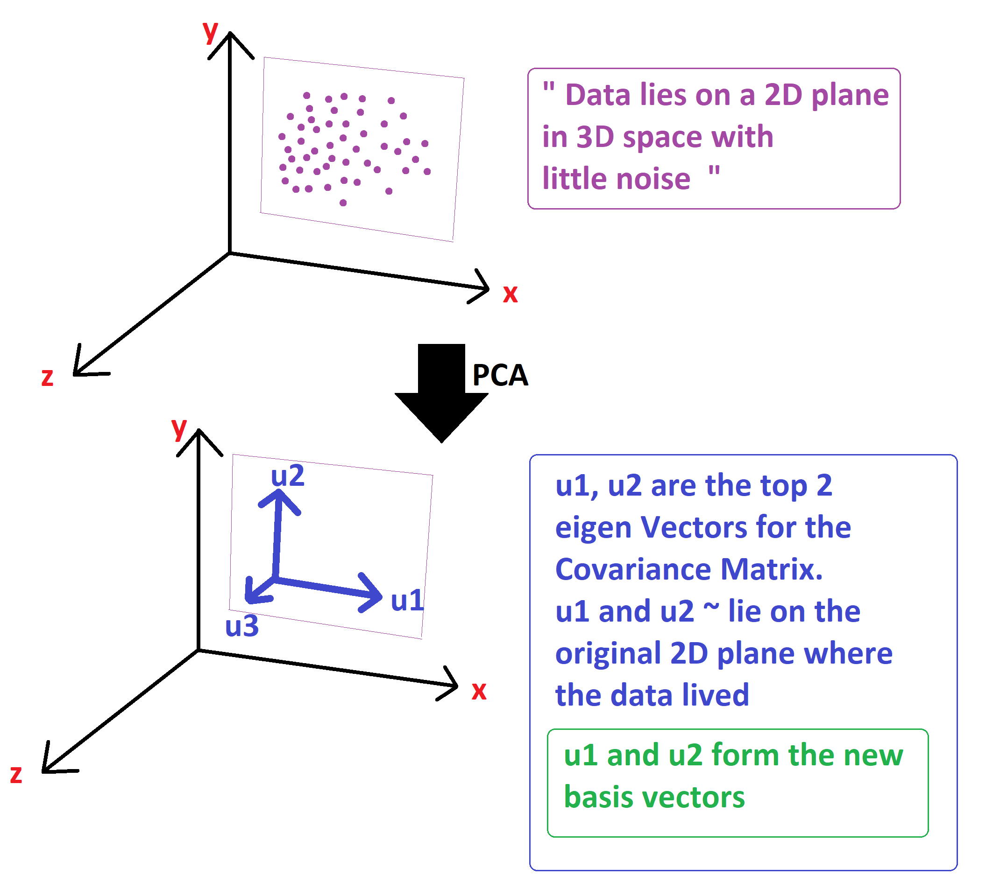

## Computational Problems (SVD Implementation)

If:
$
x^{(i)}  \in {\rm I\!R}^{10,000}
$
(eg: Image Data) 
<br><br><br>
Then, Covariance Matrix = $\Sigma \in {\rm I\!R}^{10,000 * 10,000}$ = Very Large Matrix = Finding Top Eigen VEctors is Difficult
<br><br>
Direct Computation is used for Low dimensional Data (50-100  Features)

$$
\begin{aligned}
\Sigma&=\frac{1}{m} \sum_{i=1}^{m} x^{(i)} x^{(i)^{T}} \\
Design Matrix = X  &= \begin{pmatrix}
   ---x^{(1)}--- \\
---x^{(2)}---\\.\\
.\\
.\\
---x^{(m)}---
\end{pmatrix} \\ \\
\Sigma &= X^{T}X \\
\end{aligned}
$$
$$
\Sigma =\begin{pmatrix}
| & | & .& .& |\\
| & | & .& .& |\\
| & | & .& .& |\\
| & | & .& .& |\\
x^{(1)} & x^{(2)} & .& .& x^{(m)}\\
| & | & .& .& |\\
| & | & .& .& \\
| & | & .& .& |\\
| & | & .& .& |\\
\end{pmatrix} * \begin{pmatrix}
   ---x^{(1)}--- \\
---x^{(2)}---\\.\\
.\\
.\\
---x^{(m)}---
\end{pmatrix}
$$
<div class="alert alert-block alert-danger">
<b>To Get top-k Eigen Vectors of $\Sigma$:</b> 
    <ul>
        <li>Decompose  $X$  into $X = UDV^{T}$ </li>
        <li>Top-k Columns of<b> V </b> = Top-k Eigen VEctors of $X^{T}X$ = $\Sigma$</li>
</ul>

</div>

<div class="alert alert-block alert-danger">
<b>Why is it Useful?</b> 
    <ul>
        <li>If $X$  $\in {\rm I\!R}^{m*50,000}$  $\quad\quad$ [50,000 Features]</li>
        <li>If $X$  $\in {\rm I\!R}^{100*50,000}$  $\quad\quad$ [100Training Example & 50,000 Features]</li>
        <li>Then  $\Sigma$  $\in {\rm I\!R}^{50,000*50,000}$  $\quad$ [MUCH HARDER TO REPRESENT AND COMPUTE!!]</li>
</ul>

</div>

<button type="button" class="btn btn-danger">Singular Value Decompoition ::</button>

$$
\begin{array}{l}
Matrix(A) \in \mathbb{R}^{m \times n} \\ \\
\begin{array}{rl}
\text{Sinular Decomposition of A:} \\
A & =U D V^{T} \\ 
U &= m \times n \quad Matrix  \\
D &=n\times n \quad  Matrix\\
V^{T} &=n\times n \quad  Matrix\\
\text{Column's of  U} &= \text{Eigen Vectors of } AA^{T} \\
\text{Column's of   V }&= \text{Eigen Vectors of } A^{T}A   \quad !!!!!!!!!!!!!!!!!!\\ \\
\end{array}
\end{array}
$$
$$\text{D = Diagonal Matrix(Singular Values of A)}$$

$$
D = \begin{pmatrix}
    \sigma_{1} & 0 & \dots & 0 \\
    0 & \sigma_{2} & \dots & 0 \\
    \vdots & \vdots & \ddots & \vdots \\
    0 & 0 & \dots & \sigma_{n}
\end{pmatrix}
$$
<br>
$$
\sigma_{i} = \text{Sigular Values of A}
$$

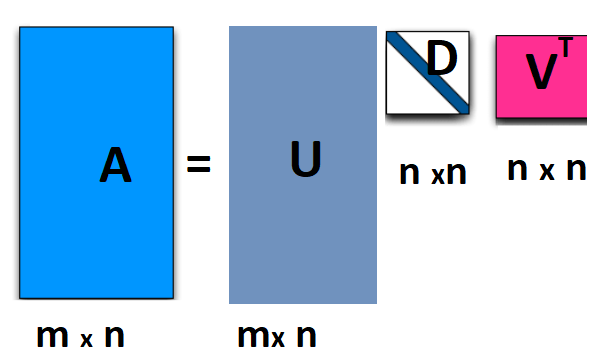

```python

U, D, VT = numpy.linalg.svd (A, full_matrices=False)

#If True (default), u and vh have the shapes (..., M, M) and (..., N, N), respectively. Otherwise, the shapes are (..., M, K) and (..., K, N), respectively, where K = min(M, N).

```

In [217]:
a = np.random.randn(9, 6) 
print(a.shape)
U, D, VT = np.linalg.svd(a, full_matrices=False)
print(U.shape, D.shape, VT.shape)
print(np.allclose(a, np.dot(u * s, vh)))

(9, 6)
(9, 6) (6,) (6, 6)
False


## Applications

<div class="alert alert-block alert-info">
$\quad \quad \quad \quad \quad \quad \quad \quad \quad  \quad \quad \quad \quad \quad \quad \quad \quad \quad \quad \quad \quad \quad \quad \quad $ <b>Applications  </b> 
<ul>
  <li>Visualization of High Dimensional Data</li>
  <li>Preprocess a dataset to reduce its dimension before running a supervised learning learning algorithm [ computational benets, reducing the data's dimension can also reduce the complexity of the hypothesis class considered
and help avoid overtting]
spaces will have smaller VC dimension).</li>
  <li>Data Compression</li>
  <li>Anamoly Detection [Find subspace on training dta, anamoly is deetcted when new dta point lies far away from sub-space]</li>
      <li>Matching / Dsitance Calculations</li>
</ul>
</div>

<b> Matching/ Distance Calculations </b>:
    - Finding Similar Faces

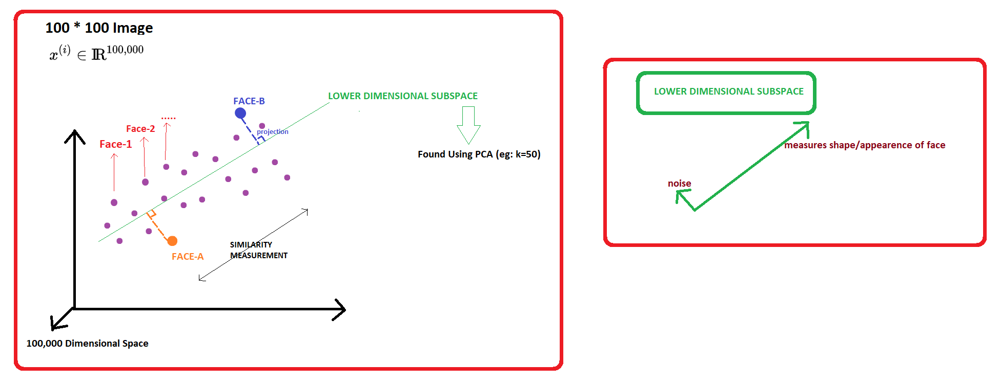

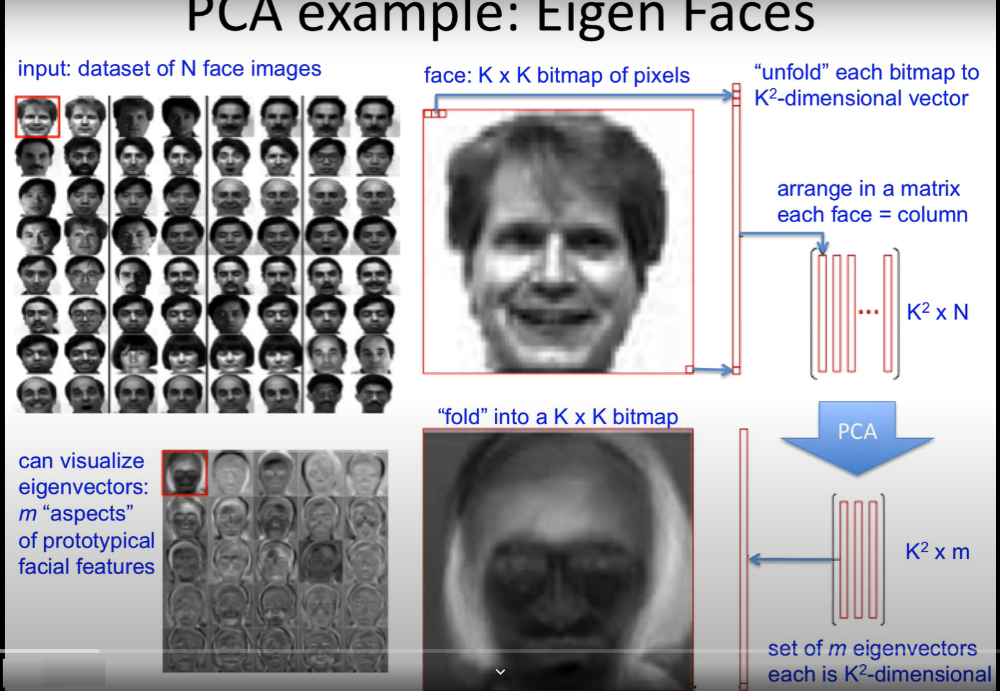

## Applications to text (Latent Semantic Indexing)

- Measure similarity between two text documents ($x^{(i)}$,$x^{(j)}$ )
- SIM($x^{(i)}$,$x^{(j)}$ ) = cos$\theta$
 $$
\cos \theta=\frac{\mathbf{x^{(i)^{T}}}, \mathbf{x^{(j)}}}{\|\mathbf{x^{(i)}}\|\|\mathbf{x^{(j)}}\|}
$$
- Smaller the angle larger the similarity (since, cosine is decreasing function of thetha)

<button type="button" class="btn btn-danger">Note: Preprocessing is Usually Skipped </button>
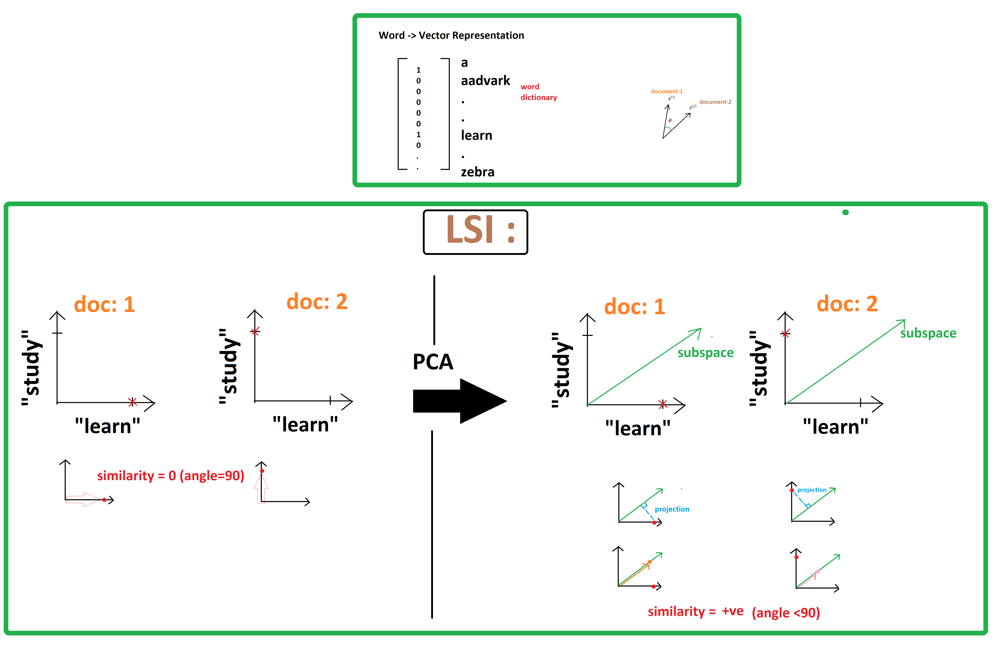

# Computational Example

### Preprocessing + Implementation

Text(0.5, 1.0, 'Eigen Vector of Cov. Matrix')

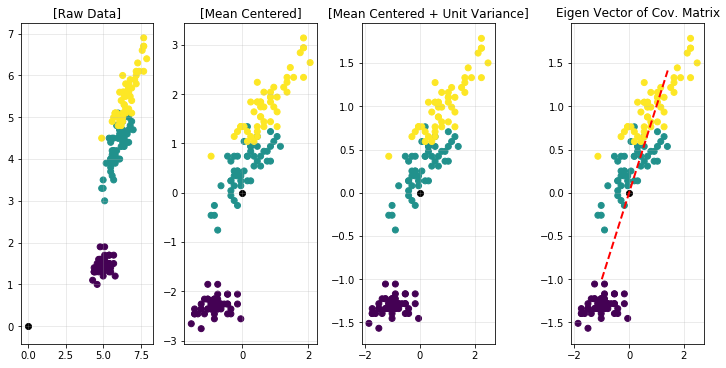

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
iris = load_iris()
y = iris.target

fig, axes = plt.subplots(1,4, figsize=(10,5),constrained_layout=True)


X = iris.data[:,[0,2]]
X_zero_mean= X- X.mean(axis=-2)
X_unit_var = X_zero_mean/ X_zero_mean.std(axis=-2)

axes[0].scatter(X[:,0], X[:,1], c=y)
axes[0].scatter(0,0, c='k')
axes[0].grid(alpha=0.3)
axes[0].set_title("[Raw Data]")
axes[1].scatter(X_zero_mean[:,0], X_zero_mean[:,1],c=y)
axes[1].scatter(0,0, c='k')
axes[1].grid(alpha=0.3)
axes[1].set_title("[Mean Centered]")
axes[2].scatter(X_unit_var[:,0], X_unit_var[:,1],c=y)
axes[2].scatter(0,0, c='k')
axes[2].grid(alpha=0.3)
axes[2].set_title("[Mean Centered + Unit Variance]")
axes[3].scatter(X_unit_var[:,0], X_unit_var[:,1],c=y)
axes[3].scatter(0,0, c='k')
axes[3].plot([0-1,top_eigen_vectors[0][0]*2],[0-1,top_eigen_vectors[1][0]*2], lw=2, c='r', ls='--')
axes[3].grid(alpha=0.3)
axes[3].set_title("Eigen Vector of Cov. Matrix")



In [2]:
def cov(X):
    "Return Covariance Matrix for the Input Data"
    X-=X.mean(axis=-2)
    return (X.T @ X)/(X.shape[0] - 1)

In [3]:
cov_matrix = cov(X_unit_var)
vals, vects = np.linalg.eigh(cov_matrix)
top_eigen_vectors = vects[:,vals.argsort()[::-1][0:1]]
X_projected = X_unit_var@top_eigen_vectors

Text(0.5, 1.0, 'Projected Data')

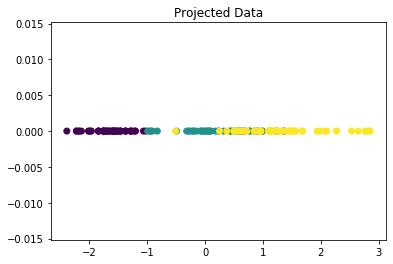

In [5]:
plt.scatter(X_projected.flatten(),np.zeros(150), c=y)
plt.title("Projected Data")

###  Scikit Implementation

In [6]:
from sklearn.datasets import load_iris
iris = load_iris()
X = iris.data[:,[0,2]]
X_zero_mean= X- X.mean(axis=-2)
X_unit_var = X_zero_mean/ X_zero_mean.std(axis=-2)
y = iris.target

In [7]:
import numpy as np
from sklearn.decomposition import PCA
pca = PCA(n_components=1)
pca.fit(X_unit_var)
X_projected = pca.transform(X_unit_var)

PCA(copy=True, iterated_power='auto', n_components=1, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [8]:
X_projected = pca.transform(X_unit_var)

Text(0.5, 1.0, 'Projected Data')

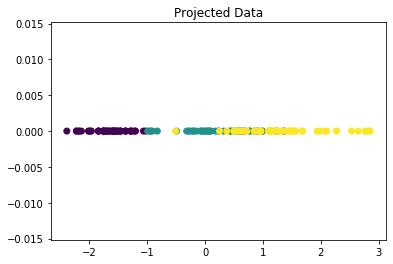

In [9]:
plt.scatter(X_projected.flatten(),np.zeros(150), c=y)
plt.title("Projected Data")

###  SVD 

#### Direct Method from Covariance Matrix

In [2289]:
from sklearn.datasets import load_iris
iris = load_iris()
X = iris.data
X_zero_mean= X- X.mean(axis=-2)
X_unit_var = X_zero_mean/ X_zero_mean.std(axis=-2)

In [32]:
def cov(X):
    "Return Covariance Matrix for the Input Data"
    X-=X.mean(axis=-2)
    return (X.T @ X)/(X.shape[0] - 1)

In [33]:
cov_matrix = cov(X_unit_var)
vals, vects = np.linalg.eigh(cov_matrix)
vals, vects

(array([0.02085386, 0.14774182, 0.9201649 , 2.93808505]),
 array([[ 0.26128628,  0.71956635,  0.37741762, -0.52106591],
        [-0.12350962, -0.24438178,  0.92329566,  0.26934744],
        [-0.80144925, -0.14212637,  0.02449161, -0.5804131 ],
        [ 0.52359713, -0.63427274,  0.06694199, -0.56485654]]))

In [34]:
top_eigen_vectors = vects[:,vals.argsort()[::-1]]
top_eigen_vectors =  top_eigen_vectors[:,0:3]

In [35]:
XX = X_unit_var @ top_eigen_vectors 

#### SVD Method from Decomposition of Design Matrix

```python
from numpy.linalg import svd
U, D, VT = svd(design_matrix, full_matrices=False)
```
 $X = U S V^H$, <br>w here $X = aU = uS= \mathtt{np.diag}(s)$  and  <br> $V^H = vh$. <br> The <b>ROWS!!</b> of $vh$ are the eigenvectors of $X^H X$ 

In [27]:
from numpy.linalg import svd
U, D, VT = svd(X_unit_var, full_matrices=False)

- Top 3 Eigen Vectors Chosen

In [28]:
top_eigen_vectors = VT[:,D.argsort()[::-1]].T  #since rows are eigen vectors
top_eigen_vectors = top_eigen_vectors[:,0:3]
top_eigen_vectors

array([[ 0.52106591, -0.37741762,  0.71956635],
       [-0.26934744, -0.92329566, -0.24438178],
       [ 0.5804131 , -0.02449161, -0.14212637],
       [ 0.56485654, -0.06694199, -0.63427274]])

- Transfromed Data:

In [29]:
X_unit_var @ top_eigen_vectors

#### Truncated SVD Method from Decomposition of Design Matrix


 SVD suffers from a problem called “sign indeterminacy”, which means the sign of the components_ and the output from transform depend on the algorithm and random state. To work around this, fit instances of this class to data once, then keep the instance around to do transformations.

In [20]:
from sklearn.decomposition import TruncatedSVD
svd_tr = TruncatedSVD(n_components=3)
svd_tr.fit(X_unit_var)
svd_tr.components_.T

array([[ 0.52106591,  0.37741762, -0.71956635],
       [-0.26934744,  0.92329566,  0.24438178],
       [ 0.5804131 ,  0.02449161,  0.14212637],
       [ 0.56485654,  0.06694199,  0.63427274]])

In [23]:
XX = svd_tr.fit_transform(X_unit_var)

### PCA Applied to Faces

In [84]:
from sklearn.datasets import fetch_lfw_people
import matplotlib.pyplot as plt

faces_dataset = fetch_lfw_people(min_faces_per_person=100,color = False)
n_samples, h, w = faces_dataset.images.shape
X = faces_dataset.data
y = faces_dataset.target
target_names = faces_dataset.target_names

X_mean_centered = X - X.mean(-2)

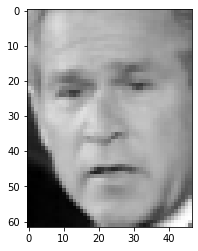

In [92]:
plt.imshow(X[400].reshape(h,w),cmap=plt.cm.gray)

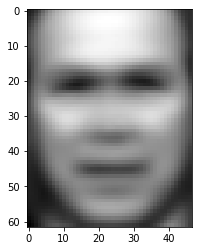

In [93]:
plt.imshow(X.mean(-2).reshape(h,w), cmap=plt.cm.gray)

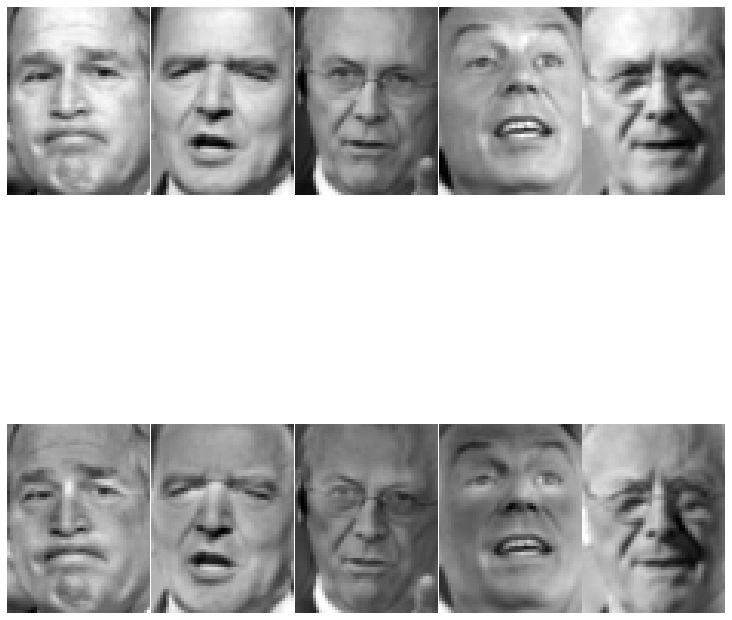

In [135]:
nrow = 2; ncol = 5;
fig, axs = plt.subplots(nrows=nrow, ncols=ncol,figsize=(10,15))

for j in range(5):
        axs[0,j].imshow(X[j].reshape(h,w),cmap=plt.cm.gray)
        axs[0,j].set_axis_off()

for j in range(5):
        axs[1,j].imshow(X_mean_centered [j].reshape(h,w),cmap=plt.cm.gray)
        axs[1,j].set_axis_off()

plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)

In [115]:
plt.subplots(5,5)
for i in range(5):
    

SyntaxError: unexpected EOF while parsing (<ipython-input-115-823ddcbe5869>, line 3)

In [234]:
from sklearn.datasets import load_iris
iris = load_iris()

In [235]:
X = iris.data
X_zero_mean= X- X.mean(axis=-2)
X_unit_var = X_zero_mean/ X_zero_mean.std(axis=-2)

In [190]:
X.shape

(150, 4)

In [306]:
from sklearn.datasets import load_iris
iris = load_iris()
X_zero_mean= X- X.mean(axis=-2)
X_unit_var = X_zero_mean/ X_zero_mean.std(axis=-2)
y = iris.target

In [307]:
import numpy as np
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(X_unit_var)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [308]:
X_projected = pca.transform(X_unit_var)

In [309]:
X_projected.var(-2)

array([2.91849782, 0.91403047])

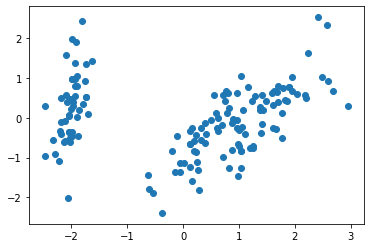

In [354]:
from sklearn.datasets import load_iris
iris = load_iris()
X_zero_mean= X- X.mean(axis=-2)
X_unit_var = X_zero_mean/ X_zero_mean.std(axis=-2)
y = iris.target
import numpy as np
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(X_zero_mean)
X_projected = pca.transform(X_unit_var)
plt.scatter(X_projected[:,0],X_projected[:,1])

In [345]:
X_projected.var(-2)

array([2.43406505, 0.78175479])

In [346]:
pca.explained_variance_

array([4.22824171, 0.24267075])

In [348]:
X_projected.var(-2) / np.sqrt(pca.explained_variance_)

array([1.18372897, 1.58694486])

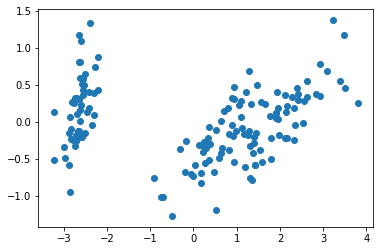

In [355]:
from sklearn.datasets import load_iris
iris = load_iris()
X_zero_mean= X- X.mean(axis=-2)
y = iris.target
import numpy as np
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(X_zero_mean)
X_projected = pca.transform(X_zero_mean)
plt.scatter(X_projected[:,0],X_projected[:,1])

In [400]:
np.corrcoef(X_projected)

array([[ 1.,  1.,  1., ..., -1., -1., -1.],
       [ 1.,  1.,  1., ..., -1., -1., -1.],
       [ 1.,  1.,  1., ..., -1., -1., -1.],
       ...,
       [-1., -1., -1., ...,  1.,  1.,  1.],
       [-1., -1., -1., ...,  1.,  1.,  1.],
       [-1., -1., -1., ...,  1.,  1.,  1.]])

In [398]:
X_projected.cor()

AttributeError: 'numpy.ndarray' object has no attribute 'cor'

In [356]:
X_projected.var(-2)

array([4.20005343, 0.24105294])

In [357]:
pca.explained_variance_

array([4.22824171, 0.24267075])

In [358]:
X_projected.var(-2) / np.sqrt(pca.explained_variance_)

array([2.04256042, 0.48933212])

In [365]:
X_zero_mean.shape

(150, 4)

In [367]:
TTT = X_zero_mean@pca.components_.T

In [376]:
np.sqrt(pca.explained_variance_)

array([2.05626888, 0.49261623])

In [382]:
X_projected[0:3,:]

array([[-2.68412563,  0.31939725],
       [-2.71414169, -0.17700123],
       [-2.88899057, -0.14494943]])

In [386]:
X_projected[2,:]*np.sqrt(pca.explained_variance_)

array([-5.9405414 , -0.07140444])

In [383]:
np.sqrt(pca.explained_variance_)

array([2.05626888, 0.49261623])

In [393]:
D = X_projected/ np.sqrt(pca.explained_variance_)

In [394]:
D.var(-2)

array([0.99333333, 0.99333333])

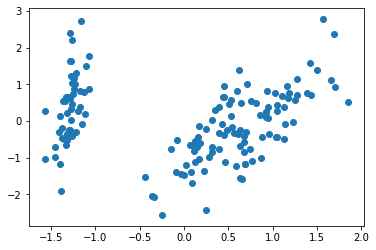

In [395]:
plt.scatter(D[:,0],D[:,1])

In [372]:
X_zero_mean.shape

(150, 4)

In [374]:
np.diag([1,2,3])

array([[1, 0, 0],
       [0, 2, 0],
       [0, 0, 3]])

In [368]:
TTT == X_projected

array([[False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [Fal

In [362]:
pca.components_.T.shape

(4, 2)

In [ ]:
X_projected

In [193]:
np.cov(X_unit_var.T)

array([[ 1.00671141, -0.11835884,  0.87760447,  0.82343066],
       [-0.11835884,  1.00671141, -0.43131554, -0.36858315],
       [ 0.87760447, -0.43131554,  1.00671141,  0.96932762],
       [ 0.82343066, -0.36858315,  0.96932762,  1.00671141]])

In [194]:
np.eigen?

Object `np.eigen` not found.


In [198]:
from numpy import linalg as LA
eigen_values, eigen_vectors = LA.eig(np.cov(X_unit_var.T))

In [200]:
eigen_values

array([2.93808505, 0.9201649 , 0.14774182, 0.02085386])

Text(0, 0.5, 'Eigen Values')

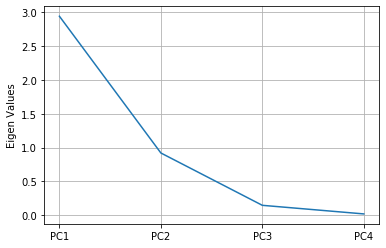

In [300]:
plt.plot(eigen_values)
plt.grid()
plt.xticks(np.arange(4), ('PC1', 'PC2', 'PC3', 'PC4'))
plt.ylabel('Eigen Values')

In [296]:
plt.xticks?

In [215]:
np.argsort?

In [224]:
np.argsort(eigen_values)[::-1][0:2]

array([0, 1], dtype=int64)

In [225]:
eigen_values[np.argsort(eigen_values)[::-1][0:2]]

array([2.93808505, 0.9201649 ])

In [205]:
eigen_vectors[:,:]

array([[ 0.52106591, -0.37741762, -0.71956635,  0.26128628],
       [-0.26934744, -0.92329566,  0.24438178, -0.12350962],
       [ 0.5804131 , -0.02449161,  0.14212637, -0.80144925],
       [ 0.56485654, -0.06694199,  0.63427274,  0.52359713]])

In [227]:
E = eigen_vectors[:,np.argsort(eigen_values)[::-1][0:2]]

In [228]:
E

array([[ 0.52106591, -0.37741762],
       [-0.26934744, -0.92329566],
       [ 0.5804131 , -0.02449161],
       [ 0.56485654, -0.06694199]])

In [229]:
E.shape

(4, 2)

In [230]:
X_unit_var.shape

(150, 4)

In [274]:
RR  = X_unit_var@E

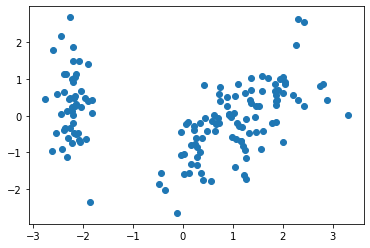

In [275]:
plt.scatter(X_projected[:,0],X_projected[:,1])

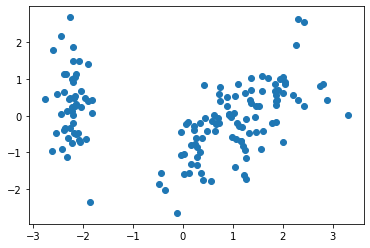

In [279]:
plt.scatter(TT[:,0],TT[:,1])

In [277]:
R = np.array(((1, 0), (0, -1)))
R

array([[ 1,  0],
       [ 0, -1]])

In [278]:
TT = RR@R

In [260]:
TT.shape

(150, 2)

In [302]:
pca.explained_variance_

array([2.93808505, 0.9201649 ])

# ProblemSet

## 2-D Example

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from numpy import linalg as LA

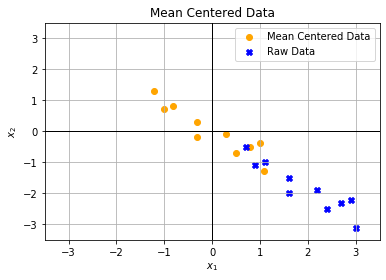

In [8]:
X = np.loadtxt('dataset/pca-data-2d.txt')

X = np.array([[ 2.4, -2.5],
       [ 0.7, -0.5],
       [ 2.9, -2.2],
       [ 2.2, -1.9],
       [ 3. , -3.1],
       [ 2.7, -2.3],
       [ 1.6, -2. ],
       [ 1.1, -1. ],
       [ 1.6, -1.5],
       [ 0.9, -1.1]])
X_0mean = X-X.mean(-2)             #Mean Centering Data

plt.scatter(X_0mean[:,0],X_0mean[:,1], c='orange', label='Mean Centered Data')
plt.scatter(X[:,0],X[:,1], c='b', label='Raw Data', marker='X')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.axvline(0, lw=1, c='k')
plt.axhline(0, lw=1,c='k')
plt.grid()
_=plt.title("Mean Centered Data")
_=plt.legend()

_=plt.axis((-3.5,3.5,-3.5 ,3.5))

In [9]:
covariance = (X_0mean.T@X_0mean)/(X_0mean.shape[0]-1)      #Covariance Matrix
lambd, eigenvec = LA.eig(covariance)                       #Eigen vectors of Covariance Matrix (columns = eigen vectors)

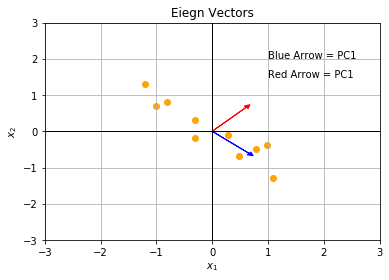

In [11]:
plt.scatter(X_0mean[:,0],X_0mean[:,1], c='orange')
plt.grid()
_=plt.title("Eiegn Vectors")



plt.axvline(0, lw=1, c='k')
plt.axhline(0, lw=1,c='k')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')



plt.arrow(0,0,eigenvec[:,0][0],eigenvec[:,0][1],lw=1, 
          fill=True,
         head_length=.1, head_width=.1,
         length_includes_head=True, 
          color='blue')

plt.arrow(0,0,eigenvec[:,1][0],eigenvec[:,1][1],lw=1, fill=True,
         head_length=.1, head_width=.1,
         length_includes_head=True, color='red')
_=plt.text(1,2,"Blue Arrow = PC1")
_=plt.text(1,1.5,"Red Arrow = PC1")
_=plt.axis((-3,3,-3 ,3))

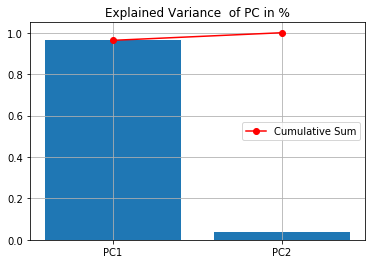

In [12]:
plt.bar(['PC1','PC2'],lambd/sum(lambd))
_=plt.plot( ['PC1','PC2'],np.cumsum(lambd/sum(lambd)), c='r',marker='o', label='Cumulative Sum')
plt.grid()
plt.title('Explained Variance  of PC in %')
_=plt.legend()

$$X_{design} = (N x P) \quad Matrix $$

$$\text{N = # Dimensions}$$
$$\text{p = # points}$$

In [13]:
X_design = X_0mean.T

$$M= Eigen Basis$$

$$U_{projected}=M^{T}X$$

In [14]:
M_T = eigenvec.T

In [15]:
u = M_T @ X_design

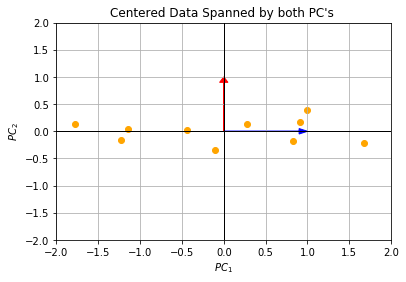

In [16]:
plt.scatter(u[0,:],u[1,:], c='orange')
plt.grid()
plt.axvline(0, lw=1, c='k')
plt.axhline(0, lw=1,c='k')
_=plt.axis((-2,2,-2,2))
_=plt.title('Centered Data Spanned by both PC\'s ')

plt.arrow(0,0,1,0,lw=1, fill=True,
         head_length=.1, head_width=.1,
         length_includes_head=True, color='blue', label='PC1')

plt.arrow(0,0,0,1,lw=1, fill=True,
         head_length=.1, head_width=.1,
         length_includes_head=True, color='red', label='PC2')


_=plt.xlabel('$PC_1$')
_=plt.ylabel('$PC_2$')

$$Reconstruction::$$

$$U_{projected}=M^{T}X$$ \
$$U=M^{T}X$$ \
$$X_{reconstructed}=(M^{T})^{-1}U$$ \
$$X_{reconstructed}=(M^{T})^{T}U$$ \
$$X_{reconstructed}=MU$$

In [862]:
x_reconstructed = eigenvec @ u      #Reconstruction using all Eigen Vectors

In [896]:
u_pc_1 = M_t[0,:] @ (X_0mean.T)    #Projecteing data onto first PC
u_pc_2 = M_t[1,:] @ (X_0mean.T)    #Projecteing data onto second PC

In [897]:
#projected Data sapnned by PC-1 Vector   (pc1-vector * projection lengths )

u_pc_1_vector = M[:,0].reshape(2,1)  * u_pc_1
u_pc_2_vector = M[:,1].reshape(2,1)  * u_pc_2

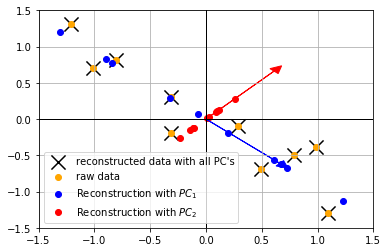

In [904]:
plt.scatter(x_reconstructed[0,:] ,x_reconstructed[1,:], marker='x', c='k',s=200, label='reconstructed data with all PC\'s')
plt.scatter(X_design[0,:] ,X_design[1,:], c='orange', label='raw data')

_=plt.axvline(0, lw=1, c='k')
_=plt.axhline(0, lw=1,c='k')
_=plt.grid()



plt.legend()

plt.scatter(*u_pc_1_vector   ,c='blue'  , label='Reconstruction with $PC_1$')
plt.scatter(*u_pc_2_vector   ,c='red'   , label='Reconstruction with $PC_2$')

plt.arrow(0,0,eigenvec[:,0][0],eigenvec[:,0][1],
          lw=1, fill=True,
         head_length=.1, head_width=.1,
         length_includes_head=True, color='blue')

plt.arrow(0,0,eigenvec[:,1][0],eigenvec[:,1][1],
          lw=1, fill=True,
         head_length=.1, head_width=.1,
         length_includes_head=True, color='red')

_=plt.legend(loc=3)

_=plt.axis((-1.5,1.5,-1.5 ,1.5))

## 3-D Example

In [4]:
X = pd.read_csv('dataset/pca-data-3d.txt', sep=",")
X = np.array(X)
X_0mean = X-X.mean(-2)             #Mean Centering Data        ##dimenisons

In [16]:
from mpl_toolkits.mplot3d import Axes3D 

<IPython.core.display.Javascript object>


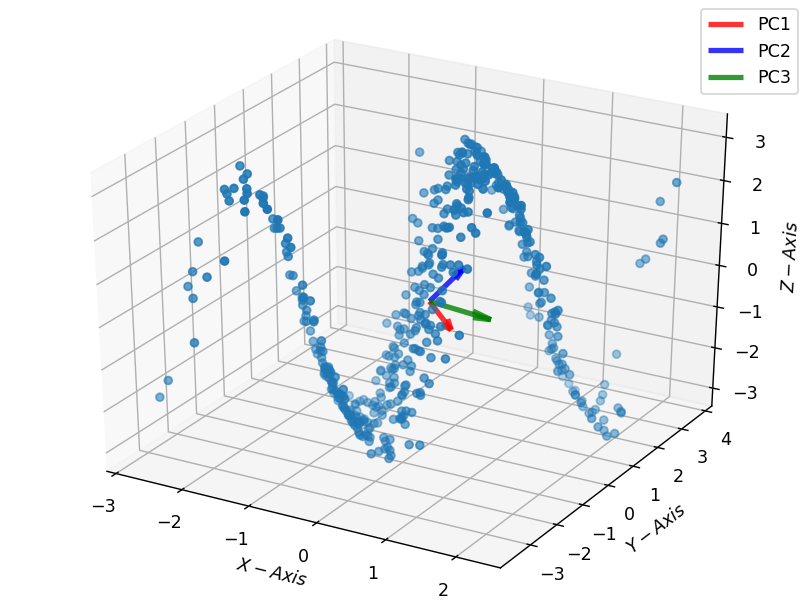

In [1671]:
%matplotlib nbagg
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X_0mean[:,0],X_0mean[:,1],X_0mean[:,2])

_=ax.set_xlabel('$X-Axis$')
_=ax.set_ylabel('$Y-Axis$')
_=ax.set_zlabel('$Z-Axis$')



for v,c,pc in zip(eigenvec,['r','b','g'],['PC1','PC2','PC3']):
    ax.quiver(
        0,0,0 ,               #Starting Point of Vector
        v[0] , v[1] , v[2] ,  # <-- directions of vector
        color = c, alpha = .8, lw = 3,label=pc
    )
    
plt.legend()

In [2271]:
covariance = (X_0mean.T@X_0mean)/(X_0mean.shape[0]-1)      #Covariance Matrix
lambd, eigenvec = LA.eig(covariance)                       #Eigen vectors of Covariance Matrix (columns = eigen vectors)
eigenvec = eigenvec[:,lambd.argsort()[::-1]]                #Sorted Based on Eigen Value

<IPython.core.display.Javascript object>


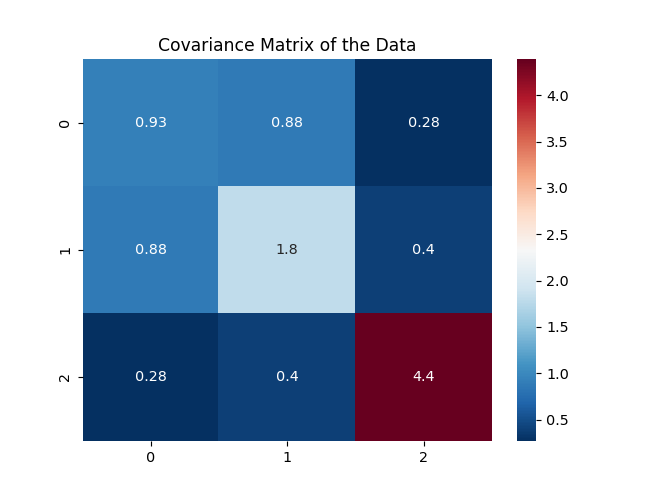

Text(0.5, 1, 'Covariance Matrix of the Data')

In [2277]:
fig, ax =plt.subplots(1,1)

sns.heatmap(covariance,cmap='RdBu_r', ax=ax,annot=True)
plt.title('Covariance Matrix of the Data')

<IPython.core.display.Javascript object>


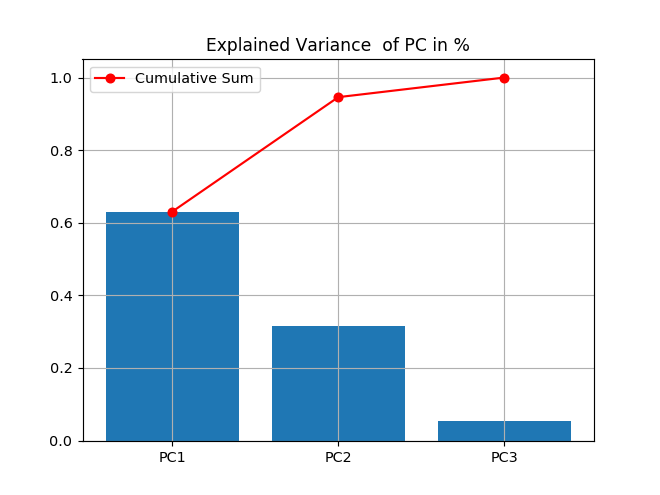

In [2270]:
fig, ax =plt.subplots(1,1)
plt.bar(['PC1','PC2','PC3'],lambd[lambd.argsort()[::-1]]/sum(lambd[lambd.argsort()[::-1]]))
_=plt.plot( ['PC1','PC2','PC3'],np.cumsum(lambd[lambd.argsort()[::-1]]/sum(lambd[lambd.argsort()[::-1]])), c='r',marker='o', label='Cumulative Sum')
plt.grid()
plt.title('Explained Variance  of PC in %')
_=plt.legend()

$$X_{design} = (N x P) \quad Matrix $$

$$\text{N = # Dimensions}$$
$$\text{p = # points}$$

In [1674]:
X_design = X_0mean.T

$$M= Eigen Basis$$
$$U_{projected}=M^{T}X$$

In [1675]:
M_T = eigenvec.T

In [1676]:
u = M_T @ X_design

<IPython.core.display.Javascript object>


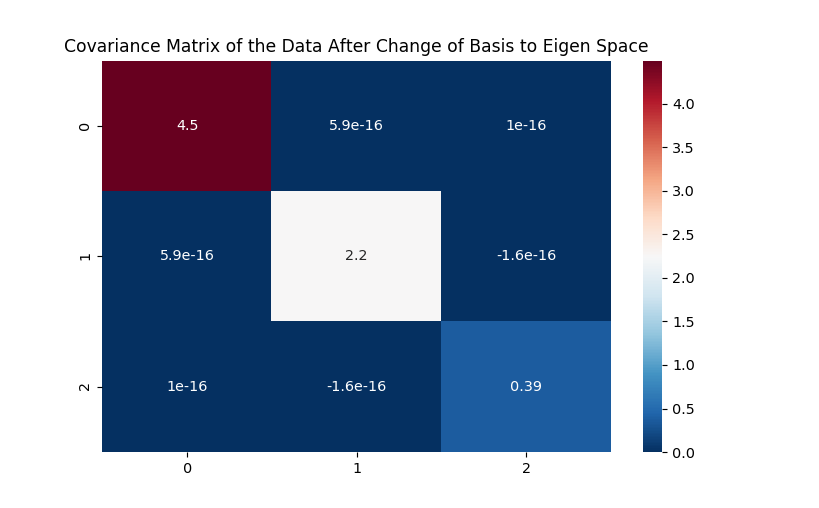

Text(0.5, 1, 'Covariance Matrix of the Data After Change of Basis to Eigen Space')

In [2289]:
covariance = (u@u.T)/(u.T.shape[0]-1)
fig, ax =plt.subplots(1,1)

sns.heatmap(covariance,cmap='RdBu_r', ax=ax,annot=True)
plt.title('Covariance Matrix of the Data After Change of Basis to Eigen Space')

<IPython.core.display.Javascript object>


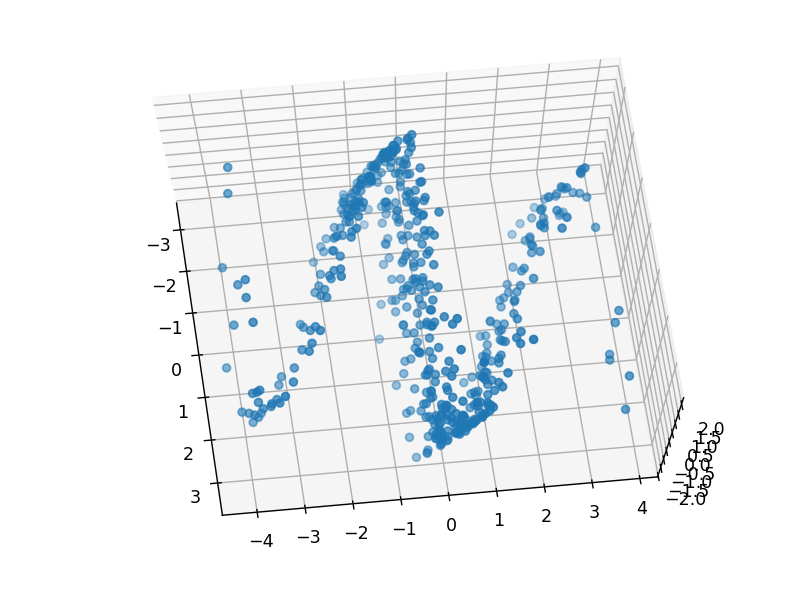

In [1679]:
%matplotlib nbagg
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(u.T[:,0],u.T[:,1],u.T[:,2])

$$Reconstruction::$$

$$U_{projected}=M^{T}X$$ \
$$U=M^{T}X$$ \
$$X_{reconstructed}=(M^{T})^{-1}U$$ \
$$X_{reconstructed}=(M^{T})^{T}U$$ \
$$X_{reconstructed}=MU$$

In [1121]:
import seaborn as sns

C:\Users\Ashwin\Miniconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


<IPython.core.display.Javascript object>


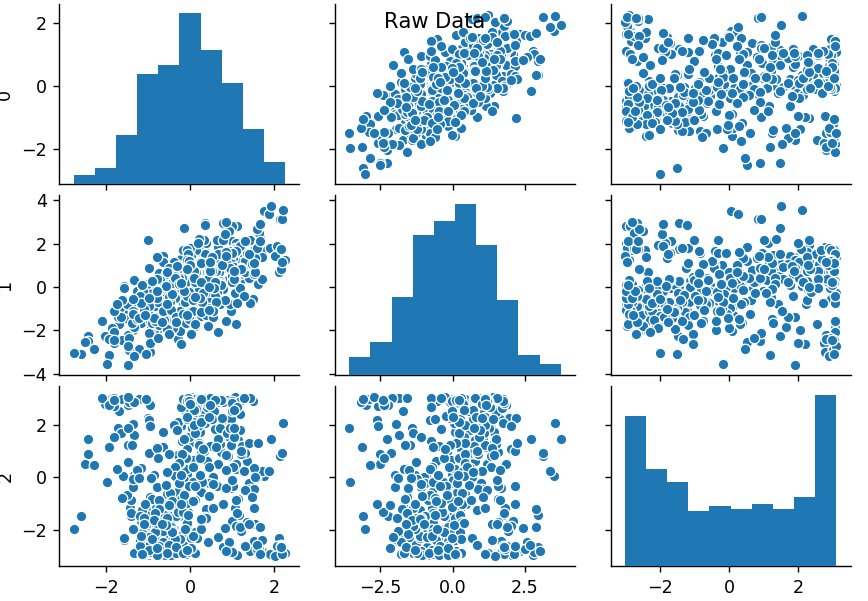

In [1129]:
g = sns.pairplot(pd.DataFrame(X_0mean))
_=g.fig.suptitle("Raw Data")

<IPython.core.display.Javascript object>


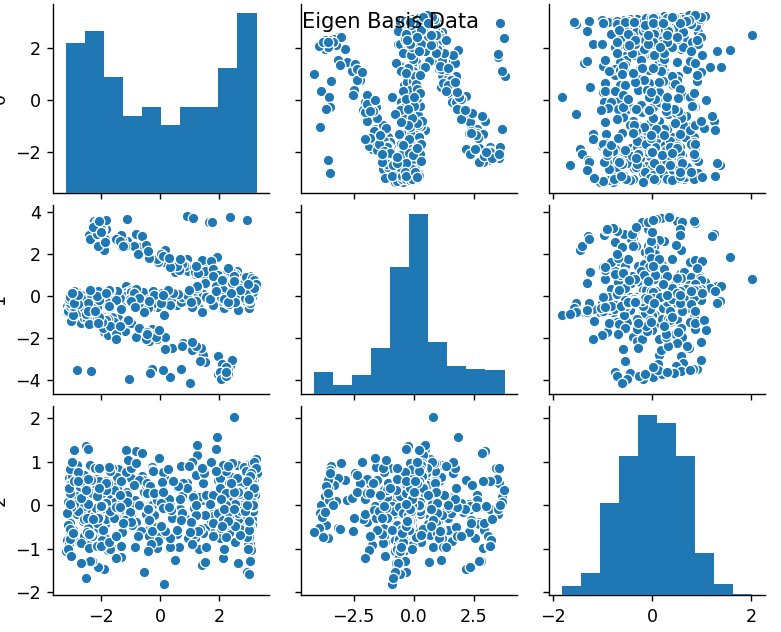

In [1133]:
g = sns.pairplot(pd.DataFrame(u.T))
_=g.fig.suptitle("Eigen Basis Data")

In [1134]:
x_reconstructed = eigenvec @ u
x_reconstructed = x_reconstructed.T

<IPython.core.display.Javascript object>


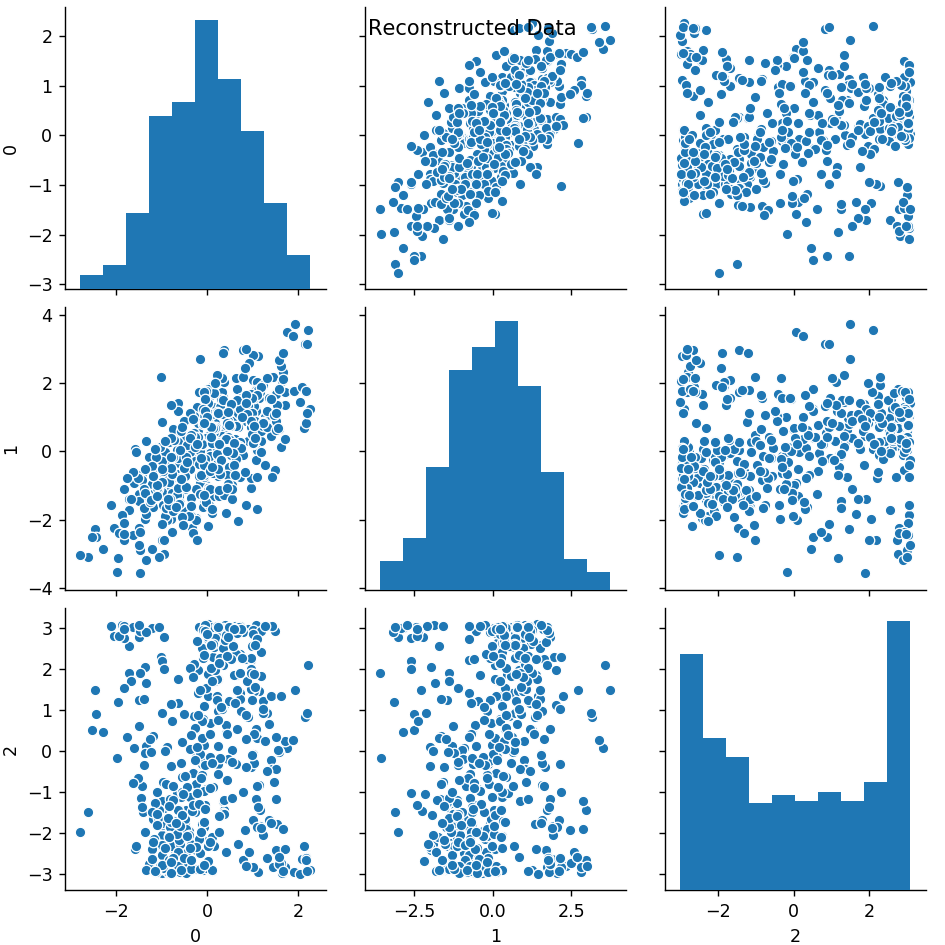

In [1135]:
g = sns.pairplot(pd.DataFrame(x_reconstructed ))
_=g.fig.suptitle("Reconstructed Data")

<IPython.core.display.Javascript object>


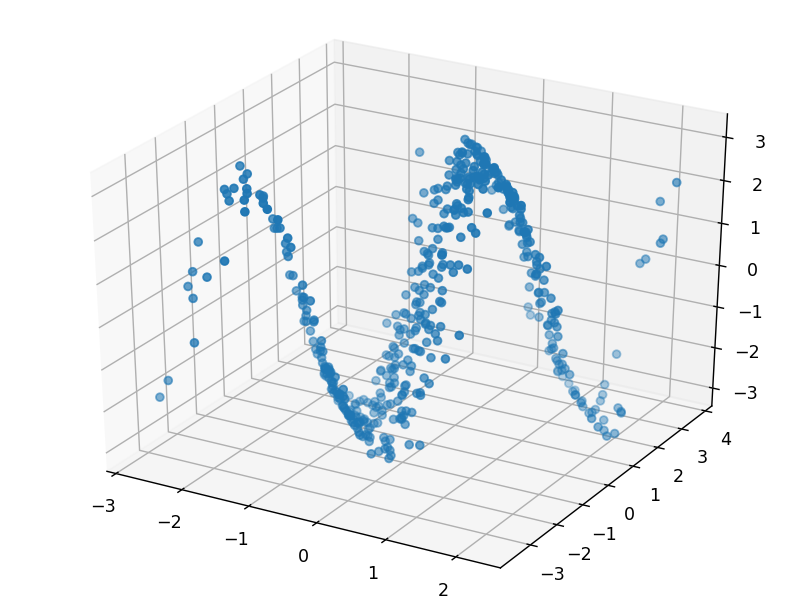

In [1024]:
%matplotlib nbagg
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(x_reconstructed[:,0],x_reconstructed[:,1],x_reconstructed[:,2])

In [1089]:
u_pc1_pc2 = M_T[[0,1],:]  @ X_design
u_pc1_pc = u_pc1_pc2.T

<IPython.core.display.Javascript object>


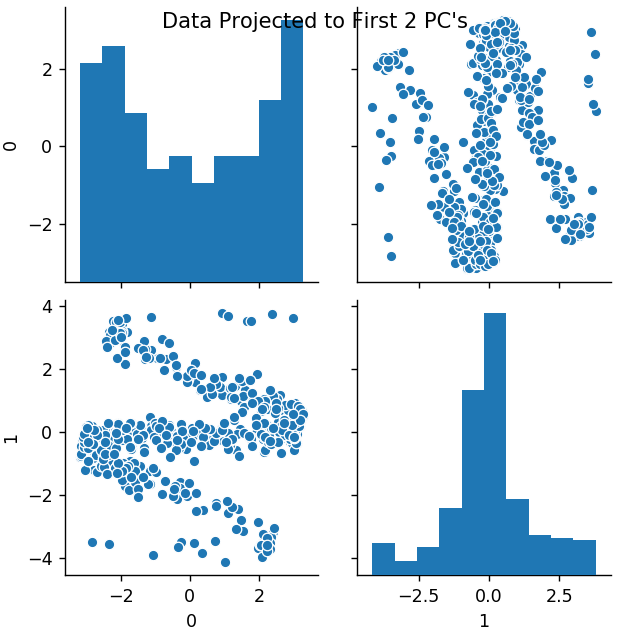

In [1137]:
g = sns.pairplot(pd.DataFrame(u_pc1_pc))
_=g.fig.suptitle("Data Projected to First 2 PC\'s")

<IPython.core.display.Javascript object>


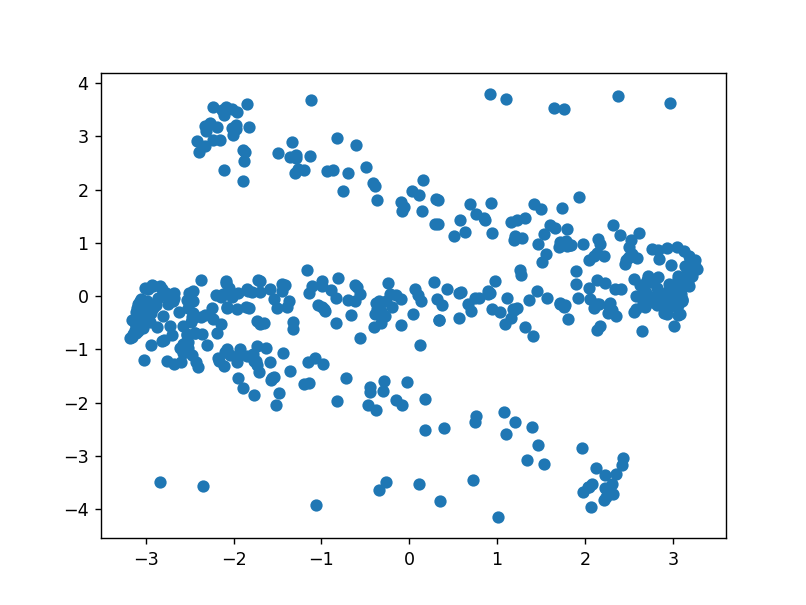

In [1091]:
plt.scatter(u_pc1_pc[:,0],u_pc1_pc[:,1])

In [1075]:
u_pc1 = M_T[[0],:]  @ X_design

<IPython.core.display.Javascript object>


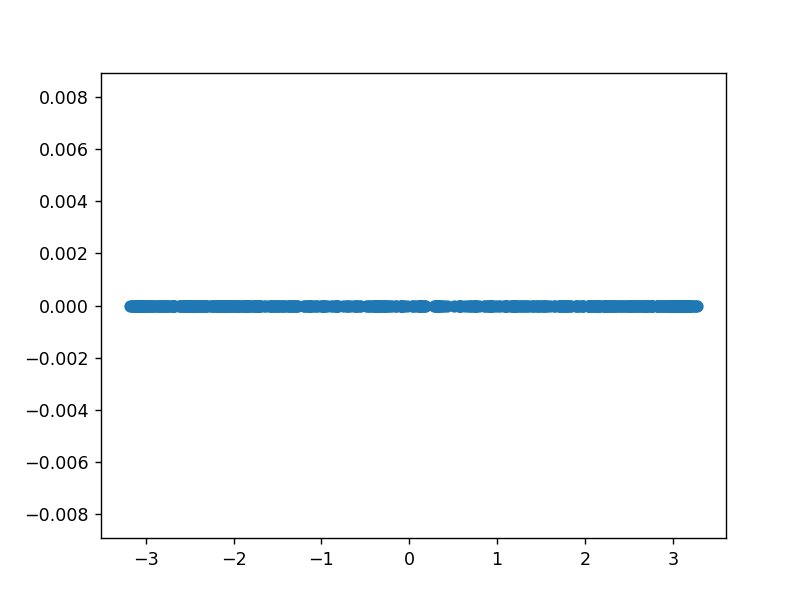

In [1095]:
plt.scatter(u_pc1[0], np.zeros(500))

$$Reconstruction$$

$$U_{projected}=M^{T}X$$ \
$$U=M^{T}X$$ \
$$X_{reconstructed}=(M^{T})^{-1}U$$ \
$$X_{reconstructed}=(M^{T})^{T}U$$ \
$$X_{reconstructed}=MU$$

In [1105]:
u_pc1_pc2 = M_T[[0,1],:]  @ X_design

In [1107]:
x_reconstructed_pc1_pc2 =  eigenvec[:,[0,1]] @ u_pc1_pc2

<IPython.core.display.Javascript object>


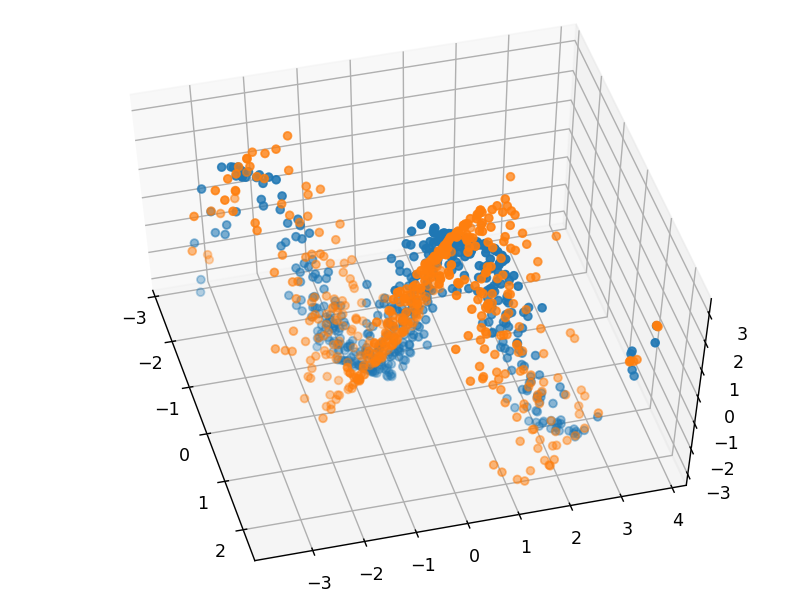

In [1139]:
%matplotlib nbagg
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(*x_reconstructed_pc1_pc2)
ax.scatter(X_0mean[:,0],X_0mean[:,1],X_0mean[:,2])

In [1097]:
u_pc1 = M_T[[0],:]  @ X_design

In [1111]:
eigenvec[:,[0,1]]

array([[ 0.12121678,  0.51120047],
       [ 0.1844957 ,  0.83065188],
       [ 0.9753296 , -0.22066159]])

In [1113]:
eigenvec[:,[0]]

array([[0.12121678],
       [0.1844957 ],
       [0.9753296 ]])

In [1114]:
x_reconstructed_pc1 =  eigenvec[:,[0]] @ u_pc1

<IPython.core.display.Javascript object>


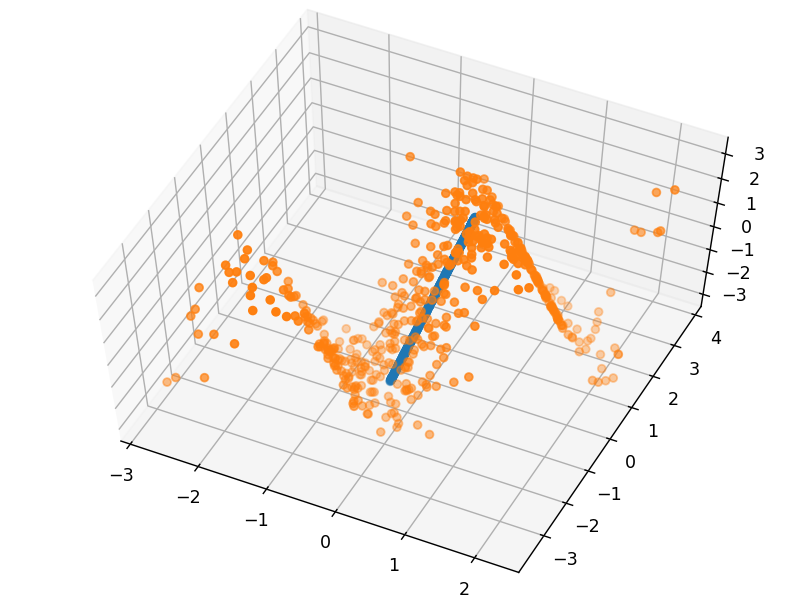

In [1140]:
%matplotlib nbagg
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(*x_reconstructed_pc1)
ax.scatter(X_0mean[:,0],X_0mean[:,1],X_0mean[:,2])

## Temporal Data Example

In [2298]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from numpy import linalg as LA

In [2299]:
X = pd.read_csv('dataset/expDat.txt', sep=",")
X = X.drop(X.columns[0], axis=1)
X = np.array(X)
X0 = X- X.mean(-2)            # ( #100 Observations, 20 Dimensions )

<IPython.core.display.Javascript object>


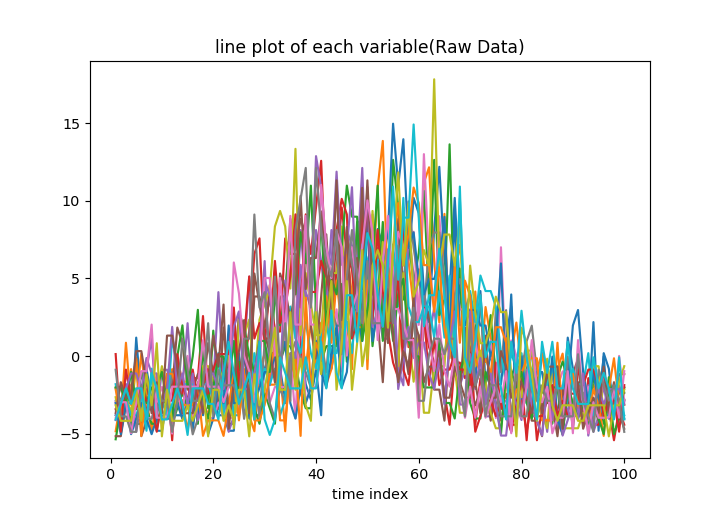

In [2300]:
time = np.arange(1, X0.shape[0]+1) # creates a range [1,2,3,...,no. of variable]

plt.figure(figsize=(7,5))

for j in range(X0.shape[1]):
    plt.plot(time, X0[:,j])  #plot column's as slices along time axis
plt.title('line plot of each variable(Raw Data)')
plt.xlabel('time index')
plt.show()

In [2301]:
covariance = (X0.T@X0)/(X0.shape[0]-1)      #Covariance Matrix
lambd, eigenvec = LA.eig(covariance)      #Eigen vectors of Covariance Matrix (columns = eigen vectors)  
eigenvec = eigenvec[:,lambd.argsort()[::-1]]                #Sorted Based on Eigen Value

<IPython.core.display.Javascript object>


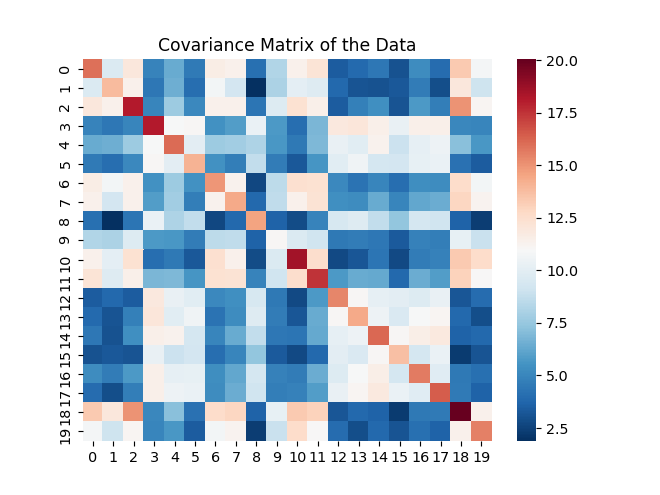

Text(0.5, 1, 'Covariance Matrix of the Data')

In [2302]:
fig, ax =plt.subplots(1,1)

sns.heatmap(covariance,cmap='RdBu_r', ax=ax)
plt.title('Covariance Matrix of the Data')

<IPython.core.display.Javascript object>


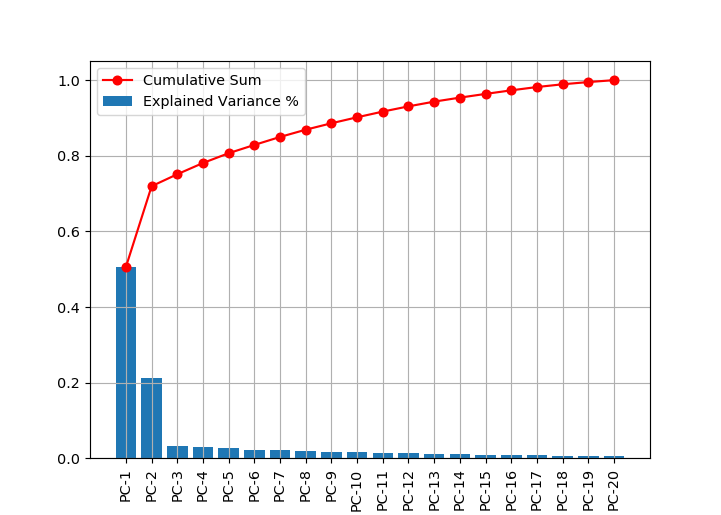

In [2304]:
plt.figure(figsize=(7,5))

l=[]
for i in range(1,21):
    l.append('PC-' + str(i))

plt.bar(l,lambd[lambd.argsort()[::-1]]/sum(lambd[lambd.argsort()[::-1]]), label='Explained Variance %')
plt.xticks(rotation=90)

_=plt.plot( l,np.cumsum(lambd[lambd.argsort()[::-1]]/sum(lambd[lambd.argsort()[::-1]])), c='r',marker='o', label='Cumulative Sum')
_=plt.grid()
_=plt.legend()

In [2305]:
X_design = X0.T
M_T = eigenvec.T

In [2306]:
u = M_T @ X_design   

<IPython.core.display.Javascript object>


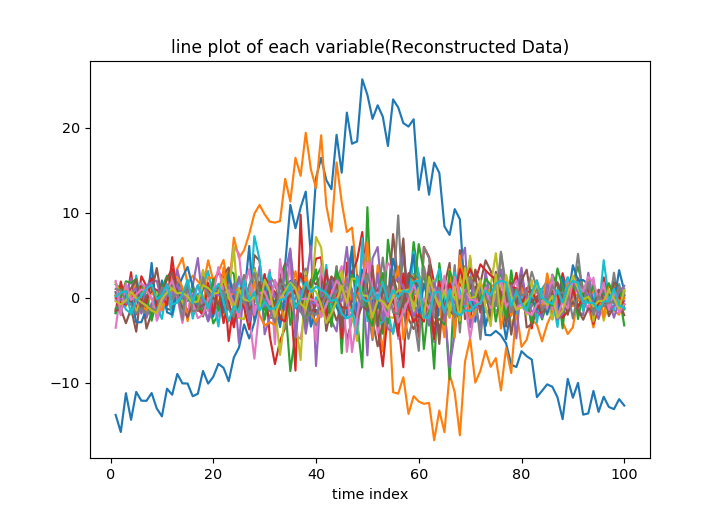

In [2307]:
time = np.arange(1, u.T.shape[0]+1) # creates a range [1,2,3,...,no. of variable]

plt.figure(figsize=(7,5))

for j in range(u.T.shape[1]):
    plt.plot(time, u.T[:,j])  #plot column's as slices along time axis
plt.title('line plot of each variable(Reconstructed Data)')
plt.xlabel('time index')
plt.show()

In [2308]:
u_pc1_pc2 = M_T[[0,1],:]  @ X_design

<IPython.core.display.Javascript object>


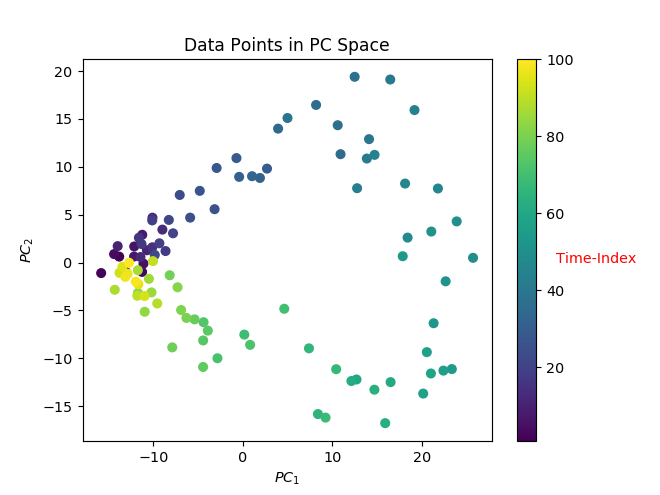

Text(35, 0, 'Time-Index')

In [2309]:
f, ax = plt.subplots()
p = plt.scatter(*u_pc1_pc2,c=time)
f.colorbar(p)
plt.xlabel('$PC_1$')
plt.ylabel('$PC_2$')
plt.title('Data Points in PC Space')
plt.text(35,0, "Time-Index", c='r')

<IPython.core.display.Javascript object>


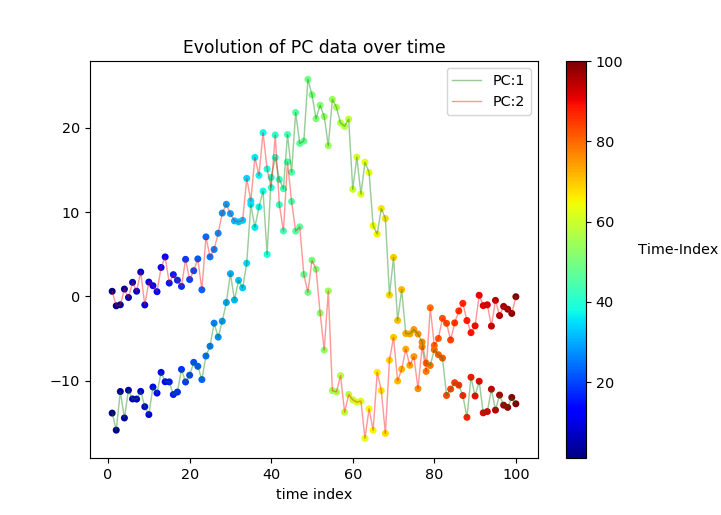

In [2326]:
time = np.arange(1, X.shape[0]+1) # creates a range [1,2,3,...,no. of variable]

import matplotlib as mpl
cmap = mpl.cm.get_cmap('jet')


plt.figure(figsize=(7,5))

for j in range(2):
    
    plt.scatter(time, u_pc1_pc2.T[:,j],c=time, cmap=cmap, s=15)  #plot column's as slices along time axis
    if j==0:
        C='g'
    else:
        C='r'
    plt.plot(time, u_pc1_pc2.T[:,j], c=C, lw=1,alpha=0.4, label='PC:{}'.format(j+1))
    
plt.title('Evolution of PC data over time')
plt.xlabel('time index')
plt.show()
plt.legend()
_=plt.text(130,5,"Time-Index")
_=plt.colorbar()

<IPython.core.display.Javascript object>


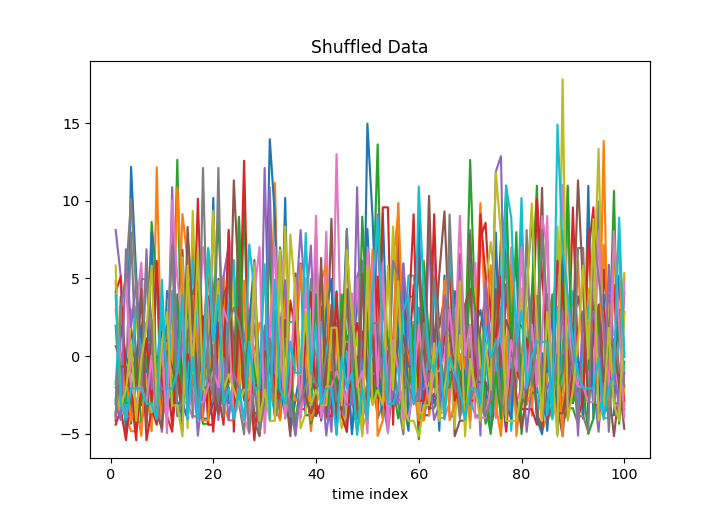

In [2327]:
time = np.arange(1, X0.shape[0]+1) # creates a range [1,2,3,...,no. of variable]

plt.figure(figsize=(7,5))

for j in range(X0_shuffled.shape[1]):
    plt.plot(time, X0_shuffled[:,j])  #plot column's as slices along time axis
plt.title('Shuffled Data')
plt.xlabel('time index')
plt.show()

In [2328]:
X0_shuffled = np.copy(X0)
for i in range(X0_shuffled.shape[1]):
    np.random.shuffle(X0_shuffled[:,i])

In [2329]:
covariance_shuffled = (X0_shuffled.T@X0_shuffled)/(X0_shuffled.shape[0]-1)      #Covariance Matrix
lambd_shuffled, eigenvec_shuffled = LA.eig(covariance_shuffled)      #Eigen vectors of Covariance Matrix (columns = eigen vectors)  
eigenvec_shuffled = eigenvec_shuffled[:,lambd_shuffled.argsort()[::-1]]                #Sorted Based on Eigen Value

<IPython.core.display.Javascript object>


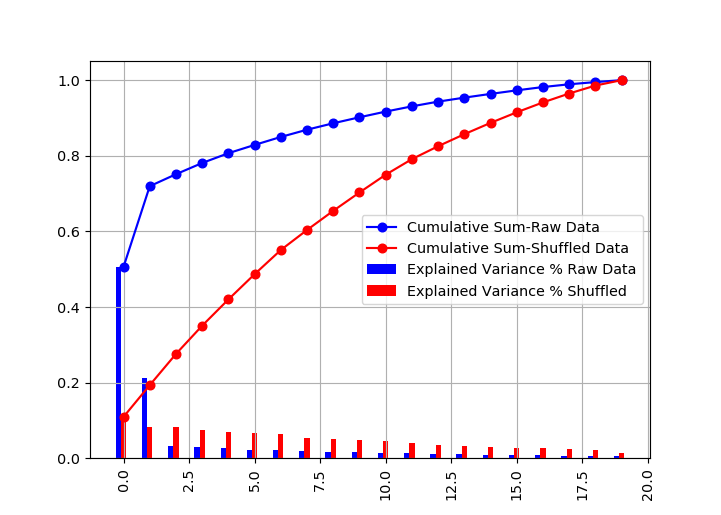

In [2330]:
plt.figure(figsize=(7,5))

l=[]

for i in range(1,20):
    l.append('PC-' + str(i))
ax = plt.subplot(111)
x=np.arange(0,20)

ax.bar(x-0.2,lambd[lambd.argsort()[::-1]]/sum(lambd[lambd.argsort()[::-1]]), label='Explained Variance % Raw Data',width=0.2,color='b')
ax.bar(x,lambd_shuffled[lambd_shuffled.argsort()[::-1]]/sum(lambd_shuffled[lambd_shuffled.argsort()[::-1]]), label='Explained Variance % Shuffled',width=0.2,color='r')

plt.xticks(rotation=90)

_=plt.plot(x,np.cumsum(lambd[lambd.argsort()[::-1]]/sum(lambd[lambd.argsort()[::-1]])), c='b',marker='o', label='Cumulative Sum-Raw Data')
_=plt.plot(x,np.cumsum(lambd_shuffled[lambd_shuffled.argsort()[::-1]]/sum(lambd_shuffled[lambd_shuffled.argsort()[::-1]])), c='r',marker='o', label='Cumulative Sum-Shuffled Data')
_=plt.grid()
_=plt.legend()

<IPython.core.display.Javascript object>


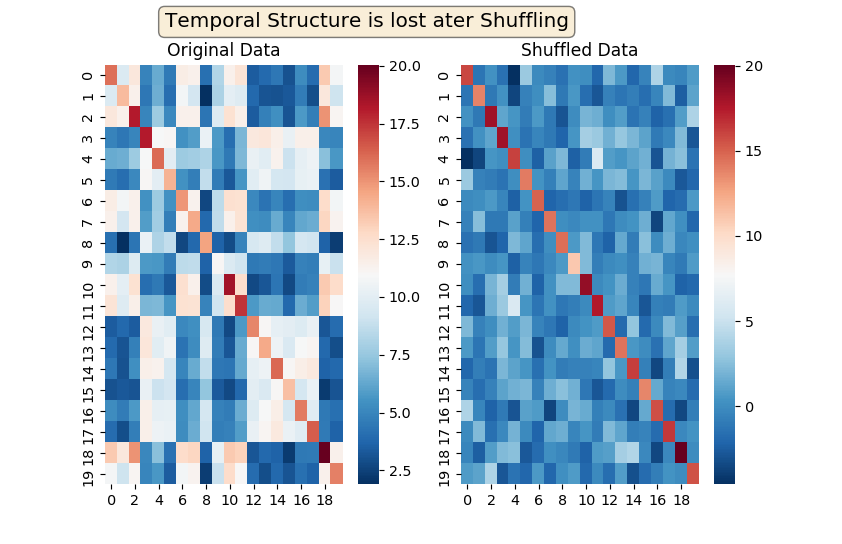

Text(-25, -2.5, 'Temporal Structure is lost ater Shuffling')

In [2360]:
fig, ax =plt.subplots(1,2)

sns.heatmap(covariance,cmap='RdBu_r', ax=ax[0])
sns.heatmap(covariance_shuffled,cmap='RdBu_r', ax=ax[1])

ax[0].set_title('Original Data')
ax[1].set_title('Shuffled Data')


props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(-25, -2.5, "Temporal Structure is lost ater Shuffling",  fontsize=14,
        verticalalignment='top', bbox=props)

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:lightgreen;">
<b>Patterns/Structure in Covariance Matrix shows that a few PC's can capture the entire dataset effectivly, whereas totally uncorrelated data needs a lot of PC's to capture data as shown in the scree plot</b> 

</p>

- Shuffling Column's in the same order dosent; change PCA result, this shows that PCA dosen't care about the order of data 

## Image Data Example

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:lightgreen;">
<b>- Motivation:</b> Images are of Different Sizes, thus patches are used <br>
   - Dimensioalty of Data = Patch Length(256 Pixels) 

</p>

In [2020]:
from imageio import imread
import glob
from sklearn.feature_extraction import image

building = [f for f in glob.glob('dataset/imgpca/*.jpg') if "b" in f]
nature = [f for f in glob.glob('dataset/imgpca/*.jpg') if "n" in f]

building_images =np.array([(np.array(imread(i))) for i in building])
nature_images =np.array([(np.array(imread(i))) for i in nature])

<IPython.core.display.Javascript object>


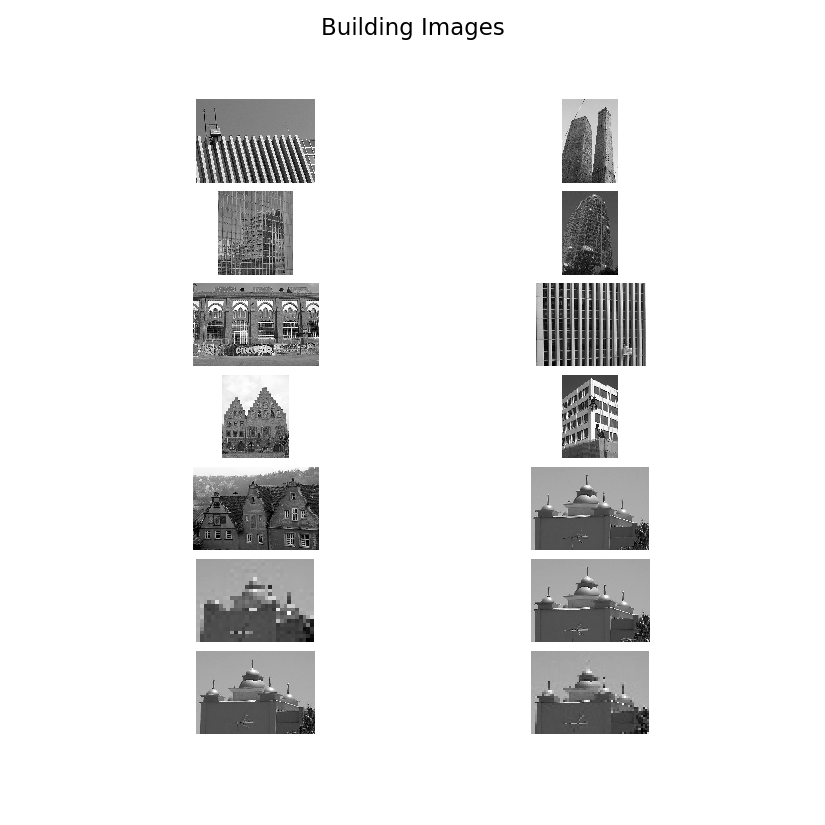

In [2041]:
fig, ax = plt.subplots(7,2, figsize=(8,8))

for i,j in zip(range(14),ax.flatten()):
    j.imshow(building_images[i],cmap='gray')
    
    
for ax in fig.axes:
    ax.axis("off")
    
_=plt.subplots_adjust(hspace=0.1,wspace=0.1)
_=fig.suptitle('Building Images', fontsize=16)

<IPython.core.display.Javascript object>


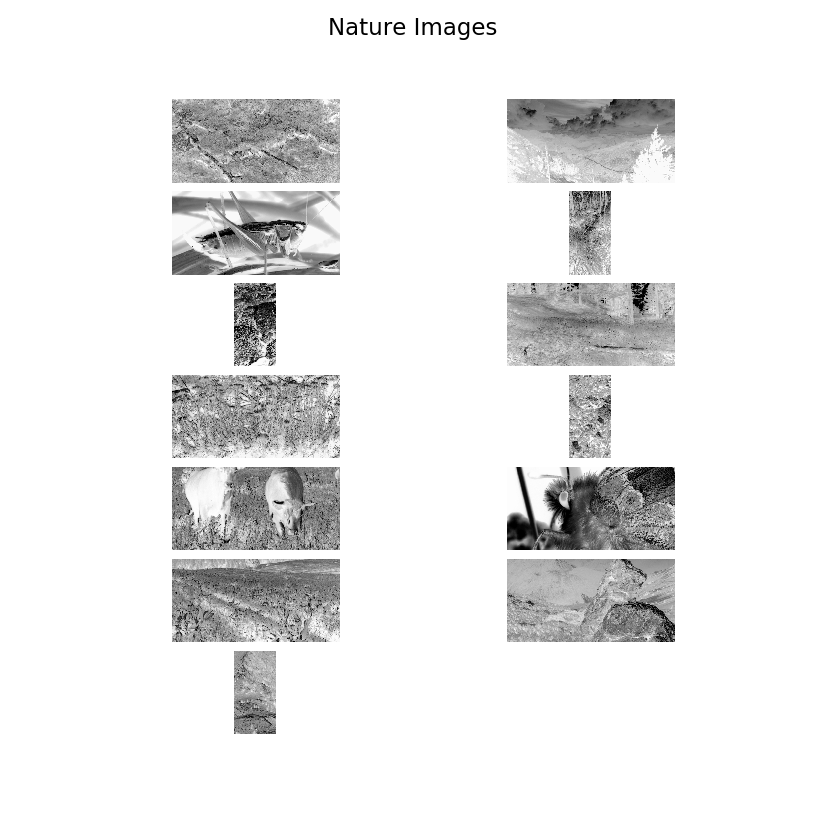

In [2047]:
fig, ax = plt.subplots(7,2, figsize=(8,8))

for i,j in zip(range(13),ax.flatten()):
    j.imshow(nature_images[i],cmap='gray_r', interpolation='none')
    


                       
for ax in fig.axes:
    ax.axis("off")
                       
_=plt.subplots_adjust(hspace=0.1,wspace=0.1)
_=fig.suptitle('Nature Images',  fontsize=16)

In [2235]:
p=[]

for i in range(14):
    if i==10:
        xxx=[]
        for i in range(5):
            xx = np.array(image.extract_patches_2d(building_images[10], (16,16),max_patches=100))
            xxx.append(xx)
 
    else:
            x=image.extract_patches_2d(building_images[i], (16,16),max_patches=500)
            x=x.reshape(500,256)
            p.append(x)

xxx=np.array(xxx)
xxx = xxx.reshape(1,500,256)
p=np.array(p)
building_data = np.concatenate((xxx,p),axis=-3)
building_data=building_data.reshape(14*500,256)
building_data = building_data - building_data.mean(-2)   #Mean Centering
building_data = building_data.T                          #(256 x 7000)  Each Patch(256pixels long) is along the columns

In [2049]:
p=[]

for i in range(13):
    x=image.extract_patches_2d(nature_images[i], (16,16),max_patches=500)
    x=x.reshape(500,256)
    p.append(x)

nature_data=np.array(p)
nature_data = nature_data.reshape(13*500,256)
nature_data = nature_data - nature_data.mean(-2)       #Mean Centering
nature_data = nature_data.T                            #(256 x 6500)   Each Patch(256pixels long) is along the columns           

<IPython.core.display.Javascript object>


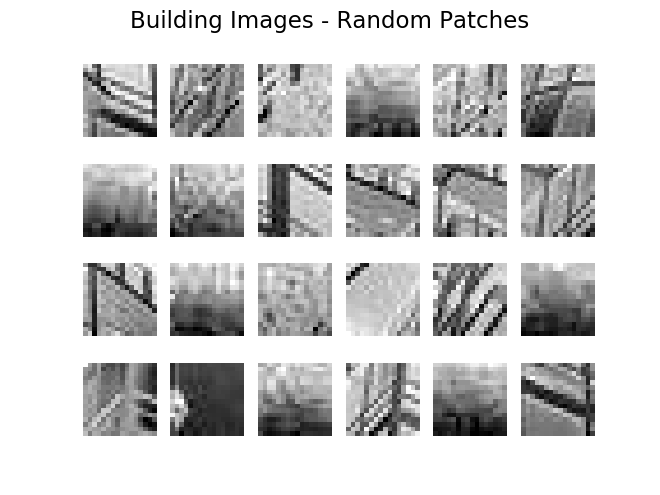

In [2054]:
fig, axs = plt.subplots(4,6)

for i,j in zip(range(400),axs.flatten()):
    j.imshow(building_data[:,i+2000].reshape(16,16),cmap='gray_r', interpolation='none')
    
for ax in fig.axes:
    ax.axis("off")
    
_=fig.suptitle('Building Images - Random Patches',  fontsize=16)

<IPython.core.display.Javascript object>


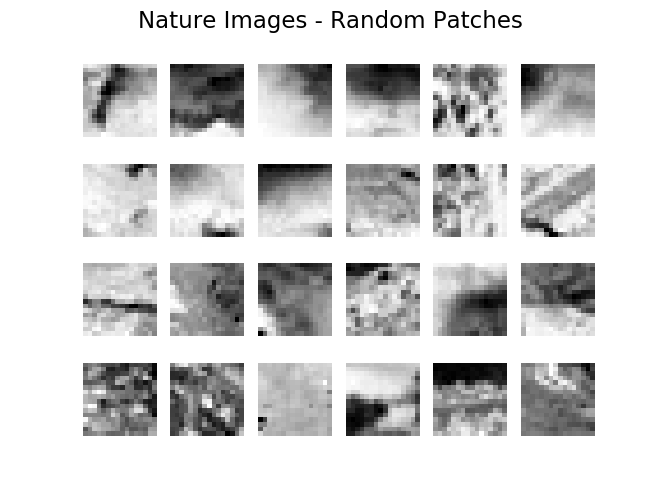

In [2053]:
fig, axs = plt.subplots(4,6)

for i,j in zip(range(400),axs.flatten()):
    j.imshow(nature_data[:,i+500].reshape(16,16),cmap='gray_r', interpolation='none')
    
for ax in fig.axes:
    ax.axis("off")
_=fig.suptitle('Nature Images - Random Patches',  fontsize=16)

In [2056]:
class SVD():
    """ X = (#obs x #dimensions) of Mean Cenetred Data Matrix """
    def __init__(self, X):
        self.X = X
        
    def fit(self):
            from numpy.linalg import svd
            self.U, self.D, self.VT = svd(self.X, full_matrices=False)
            self.eigen_vectors = self.VT.T                                    #Columns =Eigen Vectors
            self.eigen_values = (self.D**2) / self.X.shape[0]

In [2057]:
N = SVD(nature_data.T)
N.fit()
B = SVD(building_data.T)
B.fit()

<IPython.core.display.Javascript object>


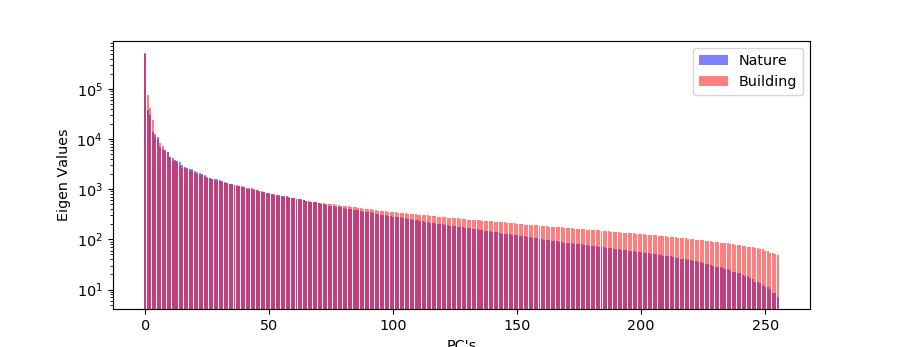

In [2374]:
plt.subplots(1,1, figsize=(8,8))

plt.bar(np.arange(256), N.eigen_values,alpha=0.5 , label='Nature' , color='blue')
plt.bar(np.arange(256), B.eigen_values ,alpha=0.5, label='Building', color='red')
        
plt.xlabel('PC\'s')
plt.ylabel('Eigen Values')
plt.legend()
plt.yscale('log')



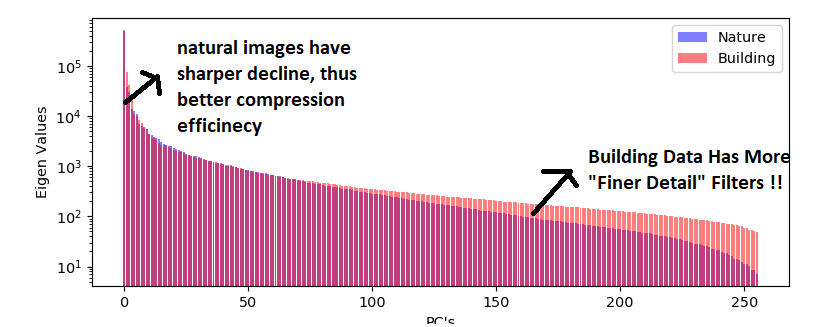

In [2059]:
N_24_PCs = N.eigen_vectors[:,0:24]
B_24_PCs = B.eigen_vectors[:,0:24]

<IPython.core.display.Javascript object>


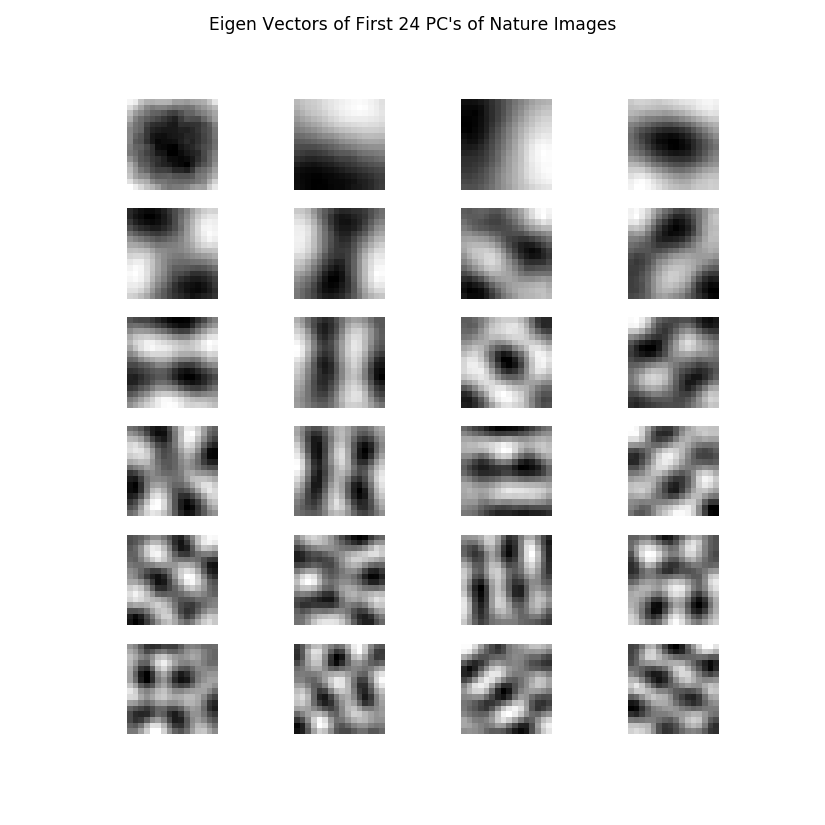

In [2062]:
fig, axs = plt.subplots(6,4, figsize=(8,8))

for i,j in zip(range(24),axs.flatten()):
    j.imshow(N_24_PCs[:,i].reshape(16,16),cmap='gray_r', interpolation='none')
    
for ax in fig.axes:
    ax.axis("off")
    
_=fig.suptitle("Eigen Vectors of First 24 PC\'s of Nature Images")

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:orange;">
<b>- ALERT!!:</b> Eiegn vectors act as a basis for the 
observatiosn( LInear Combinations), thus they act as filters
</p>

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:yellow;">
<b>- ALERT!!:</b> Eiegn vectors act as a basis for the 
observatiosn( LInear Combinations), thus they act as filters
</p>

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:lightgreen;">
<b>- ALERT!!:</b> First few eigen vectors of Building Dataset and Nature Dataset look remarkably similar, they get varied along the bottom end

</p>

<IPython.core.display.Javascript object>


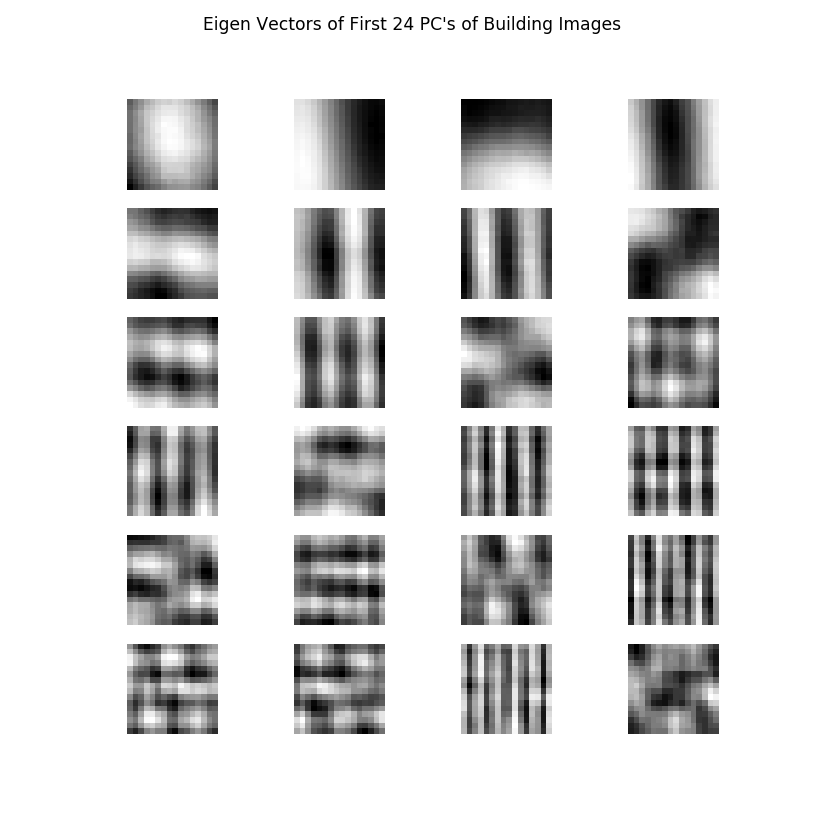

In [2063]:
fig, axs = plt.subplots(6,4, figsize=(8,8))

for i,j in zip(range(24),axs.flatten()):
    j.imshow(B_24_PCs[:,i].reshape(16,16),cmap='gray_r', interpolation='none')
    
for ax in fig.axes:
    ax.axis("off")
    
_=fig.suptitle("Eigen Vectors of First 24 PC\'s of Building Images")

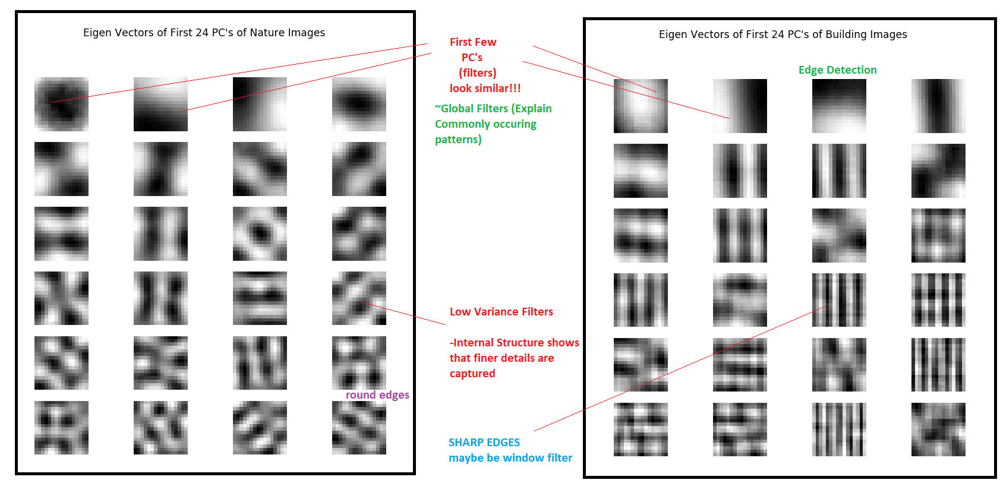

In [2064]:
##Selecting Ceratin No. of Eigen Vectors to Project ###

N_1_PCs = N.eigen_vectors[:,0:1]
N_2_PCs = N.eigen_vectors[:,0:2]
N_4_PCs = N.eigen_vectors[:,0:4]
N_8_PCs = N.eigen_vectors[:,0:8]
N_16_PCs = N.eigen_vectors[:,0:16]
N_100_PCs = N.eigen_vectors[:,0:101]

B_1_PCs = B.eigen_vectors[:,0:1]
B_2_PCs = B.eigen_vectors[:,0:2]
B_4_PCs = B.eigen_vectors[:,0:4]
B_8_PCs = B.eigen_vectors[:,0:8]
B_16_PCs = B.eigen_vectors[:,0:16]
B_100_PCs = B.eigen_vectors[:,0:100]

In [2065]:
def image_projection(img, pc, window_shape=(16,16)):
    
    """img = image(m*n) to be projected into the Priincipal COmponents(pc)"""
    
    from skimage.util.shape import view_as_windows
    matrix = img
    window_shape = window_shape
    X = view_as_windows(matrix, window_shape)[::window_shape[0],::window_shape[1],:,:]      #Patches Extracted
    XX = X.reshape(-1,16*16).T                                              # Reshaped into ((16*16), -1) one patch per column
    
    row_blocks    = X.shape[0]  #No. of row Blocks
    column_blocks = X.shape[1]  #No, of COlumn Blocks
    column_count  = column_blocks * window_shape[0]    #No.of COlumn elements
    row_count     =  row_blocks* window_shape[0]    #No. of Row Elements
    output_shape = row_count,column_count            #Output array shape
    output_array = np.empty((row_count,column_count))   #empty output array
    
    XXX1 = pc.T@XX                  #Project onto pc
    XXX1_recons = pc @ XXX1         #Reconstruct Image
    
    L=[]                                               #reconstructed Image 
    for i in range(XXX1_recons.shape[1]):
        L.append(XXX1_recons[:,i].reshape(16,16)) 
    L = np.array(L)
    
    p=0
    for j in range(row_blocks):                      #Reshape Reconstructed Image
    
        for i in range(column_blocks):
        
            output_array [0+16*j :16 +16*j ,0+16*i :16 +16*i] = L[p]
            p=p+1


    

    return(output_array)

In [ ]:
N_1_PCs = N.eigen_vectors[:,0:1]
N_2_PCs = N.eigen_vectors[:,0:2]
N_4_PCs = N.eigen_vectors[:,0:4]
N_8_PCs = N.eigen_vectors[:,0:8]
N_16_PCs = N.eigen_vectors[:,0:16]
N_100_PCs = N.eigen_vectors[:,0:101]

In [2076]:
N_eigen_vec_list = [N_1_PCs,N_2_PCs,N_4_PCs,N_8_PCs,N_16_PCs,N_100_PCs]
B_eigen_vec_list = [B_1_PCs,B_2_PCs,B_4_PCs,B_8_PCs,B_16_PCs,B_100_PCs]
number = [1,2,4,8,16,100]

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:orange;">
<b>- ALERT!!:</b>Projection is Done on Matching PC, onby reconstruction using different PC Dataset is compared
</p>

<IPython.core.display.Javascript object>


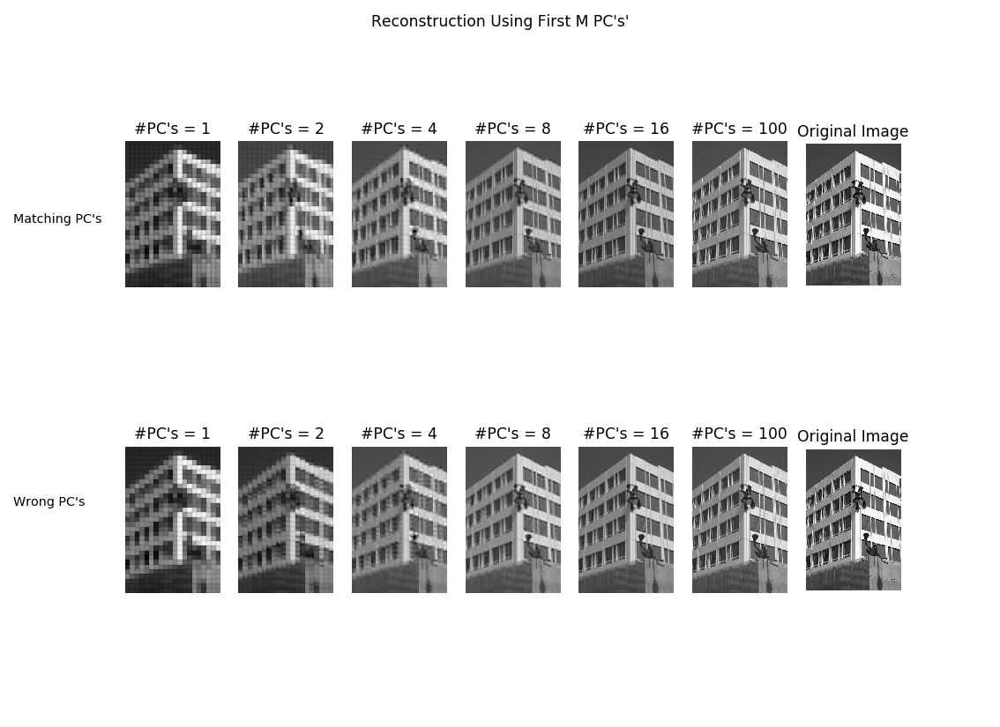

In [2142]:
fig, axs = plt.subplots(2,7, figsize=(11,8))


for i in range(6):
    axs[0,i].imshow(image_projection(building_images[7], B_eigen_vec_list[i] , window_shape=(16,16)), cmap='gray')
    axs[0,i].set_title("#PC's = {}".format(number[i]))

for i in range(6):
    axs[1,i].imshow(image_projection(building_images[7], N_eigen_vec_list[i] , window_shape=(16,16)), cmap='gray')
    axs[1,i].set_title("#PC's = {}".format(number[i]))

axs[0,6].imshow(building_images[7],cmap='gray')
axs[0,6].set_title("Original Image")

axs[1,6].imshow(building_images[7],cmap='gray')
axs[1,6].set_title("Original Image")

for ax in fig.axes:
    ax.axis("off")
    
plt.text(-2800,-800,"Matching PC\'s")
plt.text(-2800,200,"Wrong PC\'s")

_=fig.suptitle("Reconstruction Using First M PC\'s'")

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:orange;">
<b>- ALERT!!:</b>Edges on the Grids tend to go away as we use more PC that would explain finer detail
</p>

<IPython.core.display.Javascript object>


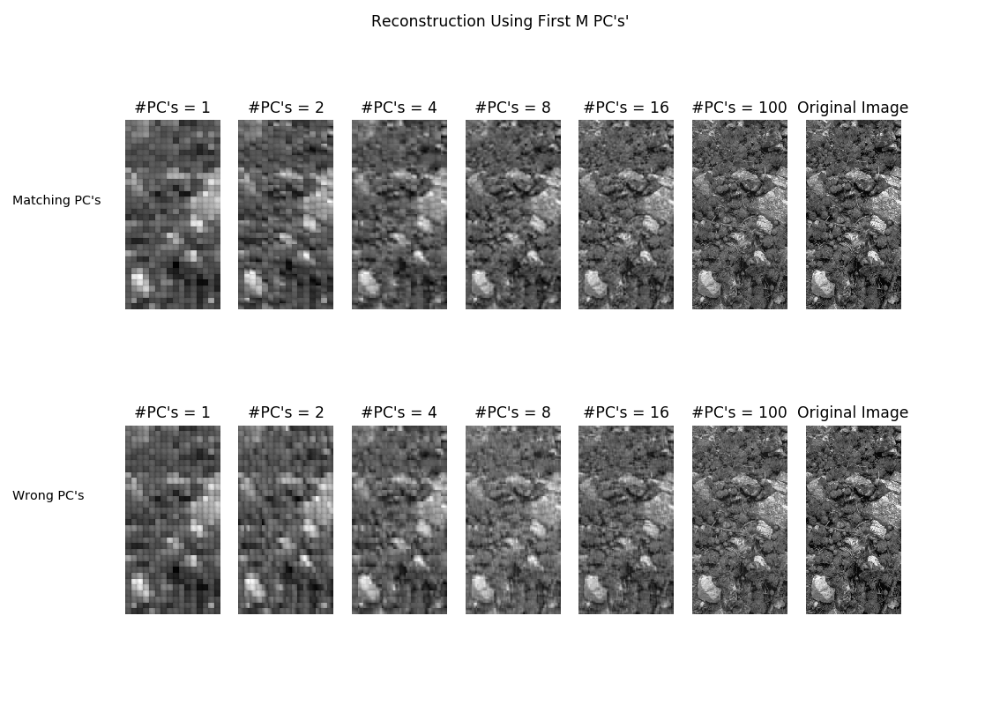

In [2188]:
fig, axs = plt.subplots(2,7, figsize=(11,8))


for i in range(6):
    axs[0,i].imshow(image_projection(nature_images[7], N_eigen_vec_list[i] , window_shape=(16,16)), cmap='gray')
    axs[0,i].set_title("#PC's = {}".format(number[i]))

for i in range(6):
    axs[1,i].imshow(image_projection(nature_images[7], B_eigen_vec_list[i] , window_shape=(16,16)), cmap='gray')
    axs[1,i].set_title("#PC's = {}".format(number[i]))

axs[0,6].imshow(nature_images[7],cmap='gray')
axs[0,6].set_title("Original Image")

axs[1,6].imshow(nature_images[7],cmap='gray')
axs[1,6].set_title("Original Image")

for ax in fig.axes:
    ax.axis("off")
    
plt.text(-2150,200,"Wrong PC\'s")
plt.text(-2150,-600,"Matching PC\'s")

_=fig.suptitle("Reconstruction Using First M PC\'s'")

In [2382]:
Y= image_projection(building_images[8], B_eigen_vec_list[0] , window_shape=(16,16))

In [2383]:
Y.shape

(320, 496)

In [2384]:
building_images[7].shape

(500, 334)

In [2200]:
text = [f for f in glob.glob('dataset/imgpca/*.jpg') if "t" in f]
text = text[53-14:]
text_images =np.array([(np.array(imread(i))) for i in text])

In [2201]:
p=[]

for i in range(13):
    x=image.extract_patches_2d(text_images[i], (16,16),max_patches=500)
    x=x.reshape(500,256)
    p.append(x)

text_data=np.array(p)
text_data = text_data.reshape(13*500,256)
text_data = text_data - text_data.mean(-2)       #Mean Centering
text_data = text_data.T                            #(256 x 6500)   Each Patch(256pixels long) is along the columns   

<IPython.core.display.Javascript object>


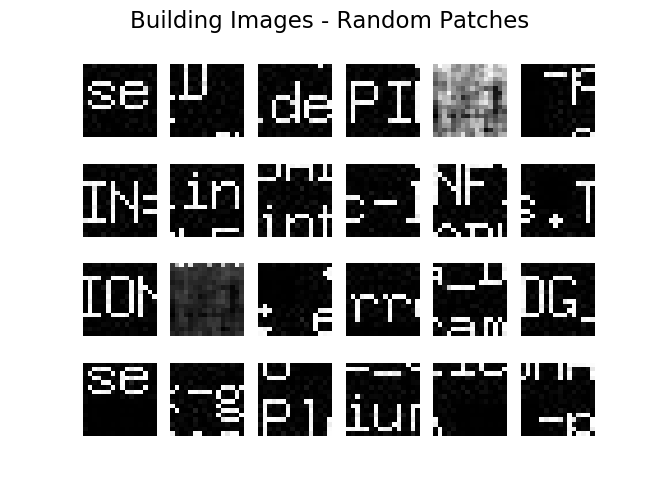

In [2203]:
fig, axs = plt.subplots(4,6)

for i,j in zip(range(400),axs.flatten()):
    j.imshow(text_data[:,i+2000].reshape(16,16),cmap='gray_r', interpolation='none')
    
for ax in fig.axes:
    ax.axis("off")
    
_=fig.suptitle('Building Images - Random Patches',  fontsize=16)

In [2212]:
T = SVD(text_data.T)
T.fit()
T_24_PCs = T.eigen_vectors[:,0:24]

<IPython.core.display.Javascript object>


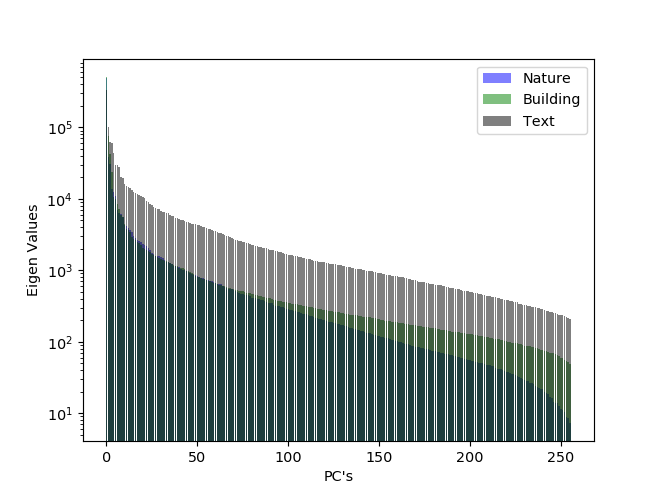

In [2221]:
fig, axs = plt.subplots(1,1)
axs.bar(np.arange(256), N.eigen_values,alpha=0.5 , label='Nature' , color='blue')
axs.bar(np.arange(256), B.eigen_values ,alpha=0.5, label='Building', color='green')
axs.bar(np.arange(256), T.eigen_values ,alpha=0.5, label='Text', color='k')

plt.xlabel('PC\'s')
plt.ylabel('Eigen Values')
plt.legend()
plt.yscale('log')


<IPython.core.display.Javascript object>


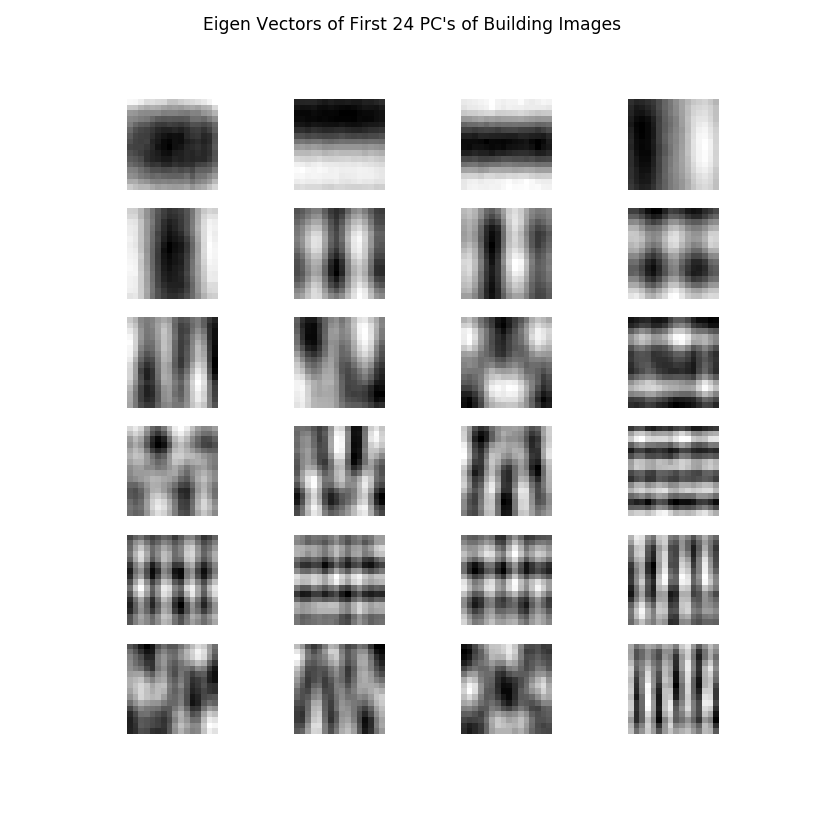

In [2222]:
fig, axs = plt.subplots(6,4, figsize=(8,8))

for i,j in zip(range(24),axs.flatten()):
    j.imshow(T_24_PCs[:,i].reshape(16,16),cmap='gray_r', interpolation='none')
    
for ax in fig.axes:
    ax.axis("off")
    
_=fig.suptitle("Eigen Vectors of First 24 PC\'s of Building Images")

In [2223]:
T_1_PCs = T.eigen_vectors[:,0:1]
T_2_PCs = T.eigen_vectors[:,0:2]
T_4_PCs = T.eigen_vectors[:,0:4]
T_8_PCs = T.eigen_vectors[:,0:8]
T_16_PCs = T.eigen_vectors[:,0:16]
T_100_PCs = T.eigen_vectors[:,0:101]

In [2224]:
T_eigen_vec_list = [T_1_PCs,T_2_PCs,T_4_PCs,T_8_PCs,T_16_PCs,T_100_PCs]

<IPython.core.display.Javascript object>


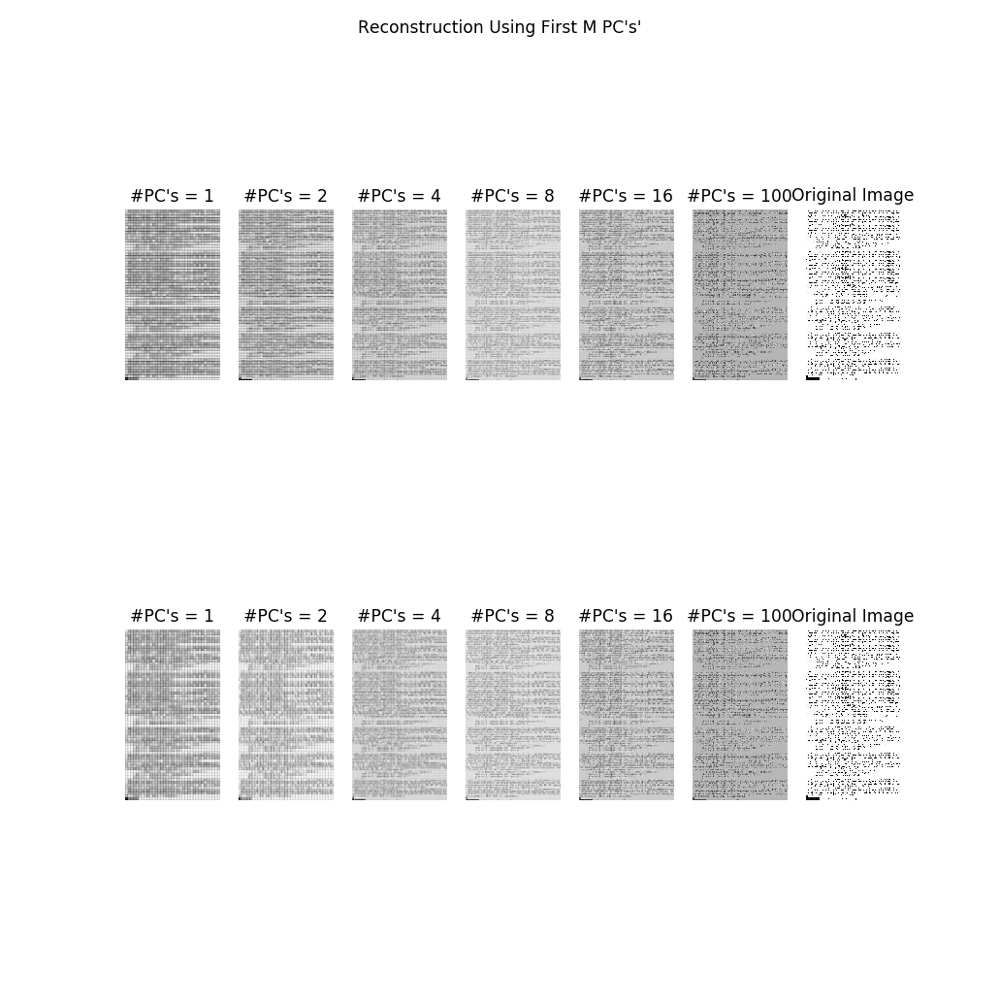

In [2234]:
fig, axs = plt.subplots(2,7, figsize=(10,10))


for i in range(6):
    axs[0,i].imshow(image_projection(text_images[4], T_eigen_vec_list[i] , window_shape=(16,16)), cmap='gray')
    axs[0,i].set_title("#PC's = {}".format(number[i]))

for i in range(6):
    axs[1,i].imshow(image_projection(text_images[4], B_eigen_vec_list[i] , window_shape=(16,16)), cmap='gray')
    axs[1,i].set_title("#PC's = {}".format(number[i]))

axs[0,6].imshow(text_images[4],cmap='gray')
axs[0,6].set_title("Original Image")

axs[1,6].imshow(text_images[4],cmap='gray')
axs[1,6].set_title("Original Image")

for ax in fig.axes:
    ax.axis("off")

_=fig.suptitle("Reconstruction Using First M PC\'s'")

$$Mean Squared Error$$

In [ ]:
N_eigen_vec_list = [N_1_PCs,N_2_PCs,N_4_PCs,N_8_PCs,N_16_PCs,N_100_PCs]
B_eigen_vec_list = [B_1_PCs,B_2_PCs,B_4_PCs,B_8_PCs,B_16_PCs,B_100_PCs]
number = [1,2,4,8,16,100]

In [2489]:
mse_building_correctpc = []
mse_building_wrongpc = []
mse_natural_correctpc = []
mse_natural_wrongpc = []

for i in range(6):
    X = image_projection(nature_images[7], N_eigen_vec_list[i] , window_shape=(16,16))
    mse_natural_correctpc.append(((nature_images[7]- X)**2).mean(axis=None))
    
for i in range(6):
    X = image_projection(nature_images[7], B_eigen_vec_list[i] , window_shape=(16,16))
    mse_natural_wrongpc.append(((nature_images[7]- X)**2).mean(axis=None))
    
for i in range(6):
    X = image_projection(building_images[7], B_eigen_vec_list[i] , window_shape=(16,16))
    Y = building_images[7][0:X.shape[0],0:X.shape[1]]
    mse_building_correctpc.append(((Y- X)**2).mean(axis=None))
    
for i in range(6):
    X = image_projection(building_images[7], N_eigen_vec_list[i] , window_shape=(16,16))
    Y = building_images[7][0:X.shape[0],0:X.shape[1]]
    mse_building_wrongpc.append(((Y- X)**2).mean(axis=None))

In [2490]:
PC = [1,2,4,8,16,100]

<IPython.core.display.Javascript object>


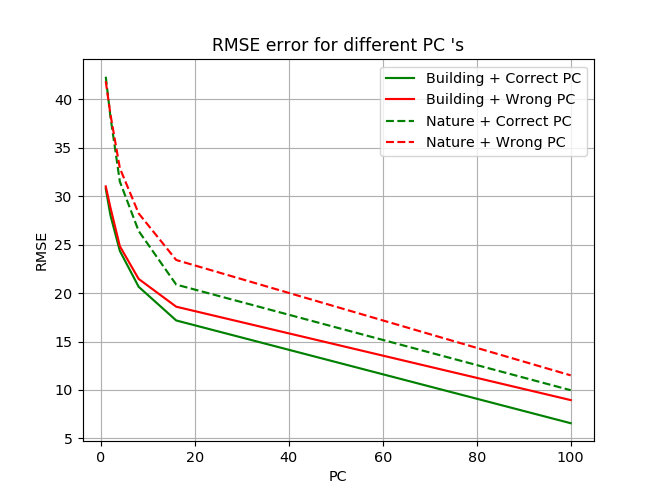

Text(0.5, 1.0, "RMSE error for different PC 's")

In [2499]:
plt.plot(PC, np.sqrt(mse_natural_correctpc), c='g', label='Building + Correct PC')
plt.plot(PC, np.sqrt(mse_natural_wrongpc), c='r' , label='Building + Wrong PC')

plt.plot(PC, np.sqrt(mse_building_correctpc), c='g', label='Nature + Correct PC', ls='--')
plt.plot(PC, np.sqrt(mse_building_wrongpc), c='r' , label='Nature + Wrong PC', ls='--')

plt.xlabel('PC')
plt.ylabel('RMSE')
plt.legend()
plt.grid()

plt.title('RMSE error for different PC \'s')

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:lightgreen;">
<b>- ALERT!!:</b>When we start using PC's that handle finer details(low variance eigen values), there seems to be a deviation on errors, thus matching/ non matching PC's (usage of correct basis)  become more serious
</p>

<p style="border-radius: 30px;
          border:2px; 
          border-style:solid; 
          border-color:#000000;
          padding: 2em;
          box-shadow: 5px 10px;
          text-align: justify;
          background-color:orange;">
<b>- ALERT!!:</b>Correct PC's have lower R.M.S.E
</p>

- Applcation:::: DEEP LEARNING - TRANSFER LEARNING

Transfer Learning(USing a model trained a model on a different dataset is used on another unrelated dataset)

- How to compare statistics of these datasets???
<br>

Eg: chest vs Stomact X-ray  <br>
     chest vs Brain X-ray
     
<br>
     
    - PCA is used to compare statistics of datasets in terms of Variances